In [1]:
import os
import pandas as pd
import numpy as np
from glob import glob
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats.mstats import pearsonr
from flexitext import flexitext
import matplotlib.pyplot as plt
import statsmodels.api as sm


Run lmm regression:

Pos_arousal = w_score + NAcc_TR_x + (subject)



- Re-calculate z-score data with only samples used.
- Cut out any neural point that has a z-score>3.
- remove watch score bigger than 3.
- Check onset NAcc and AIns for typo.

# Homemade functions

In [2]:
def get_trailer_peak(timecourse, max_min):

    # Get the maximum peak of the timecourse.
    if(max_min == 'max'):
        peak_id = np.argmax(timecourse)
    elif(max_min == 'min'):
        peak_id = np.argmin(timecourse)
    else: 
        print("Incorrect max_min value. Please use 'max' or 'min'.")

    # Check if the peak is the first or last timepoint.
    # For the peak, I am getting the average for all time points 
    # one TR before and after the peak.
    if(peak_id == 0):
        peak = np.mean(timecourse[peak_id:peak_id+1])
    elif(peak_id == len(timecourse)-1):
        peak = np.mean(timecourse[peak_id-1:peak_id])
    else:
        peak = np.mean(timecourse[peak_id-1:peak_id+1])
    
    return peak

In [3]:

def plot_correlations_bothTrailers(dataset_df, type, comedy_corr, horror_corr, title):
    
    # Define ROI labels. 
    NAcc_label = "NAcc_" + type
    AIns_label = "AIns_" + type
    MPFC_label = "MPFC_" + type

    whole_both_trailers_plot = sns.pairplot(
        dataset_df,
        kind="reg",
        x_vars=[NAcc_label, AIns_label, MPFC_label],
        y_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"], 
        hue="Type",
        palette="viridis", 
        #scatter_kws = {"s":3} try to change the size of the dots
        height=5,
        aspect=1.2)
    
    whole_both_trailers_plot.fig.suptitle(title, y=1.03, fontsize=20, fontweight ="bold")
    plt.rc('legend', fontsize=25, title_fontsize=28, markerscale=2)

    # Add annotations to the first plot. 
    comedy_cor_string = "C r= " + str(round(comedy_corr[0][0], 4)) + "; p-value: " + str(round(comedy_corr[0][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[0][0], 4)) + "; p-value: " + str(round(horror_corr[0][1], 5))
    whole_both_trailers_plot.axes[0, 0].text(s=horror_cor_string, x=.07, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the second plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[1][0], 4)) + "; p-value: " + str(round(comedy_corr[1][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[1][0], 4)) + "; p-value: " + str(round(horror_corr[1][1], 5))
    whole_both_trailers_plot.axes[1, 0].text(s=horror_cor_string, x=.07, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the third plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[3][0], 4)) + "; p-value: " + str(round(comedy_corr[3][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[3][0], 4)) + "; p-value: " + str(round(horror_corr[3][1], 5))
    whole_both_trailers_plot.axes[0, 1].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the fourth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[4][0], 4)) + "; p-value: " + str(round(comedy_corr[4][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[4][0], 4)) + "; p-value: " + str(round(horror_corr[4][1], 5))
    whole_both_trailers_plot.axes[1, 1].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the fifth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[6][0], 4)) + "; p-value: " + str(round(comedy_corr[6][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[6][0], 4)) + "; p-value: " + str(round(horror_corr[6][1], 5))
    whole_both_trailers_plot.axes[0, 2].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the sixth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[7][0], 4)) + "; p-value: " + str(round(comedy_corr[7][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[7][0], 4)) + "; p-value: " + str(round(horror_corr[7][1], 5))
    whole_both_trailers_plot.axes[1, 2].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)



In [4]:

def plot_correlations3_bothTrailers(dataset_df, type, comedy_corr, horror_corr, title):
    
    # Define ROI labels. 
    NAcc_label = "NAcc_" + type
    AIns_label = "AIns_" + type
    MPFC_label = "MPFC_" + type

    whole_both_trailers_plot = sns.pairplot(
        dataset_df,
        kind="reg",
        x_vars=[NAcc_label, AIns_label, MPFC_label],
        y_vars=["Pos_arousal_scaled", "Neg_arousal_scaled", "W_score_scaled"], 
        hue="Type",
        palette="viridis", 
        #scatter_kws = {"s":3} try to change the size of the dots
        height=5,
        aspect=1.2)
    
    whole_both_trailers_plot.fig.suptitle(title, y=1.03, fontsize=20, fontweight ="bold")
    plt.rc('legend', fontsize=25, title_fontsize=28, markerscale=2)

    # Calculate coordinates for plotting. 
    NAcc_x_coord = np.mean(dataset_df[NAcc_label].max() + np.abs(dataset_df[NAcc_label].min())) * -0.15
    AIns_x_coord = np.mean(dataset_df[AIns_label].max() + np.abs(dataset_df[AIns_label].min())) * -0.15
    MPFC_x_coord = np.mean(dataset_df[MPFC_label].max() + np.abs(dataset_df[MPFC_label].min())) * -0.15

    PA_y_coord = (dataset_df["Pos_arousal_scaled"].max() - dataset_df["Pos_arousal_scaled"].min()) * -0.35 
    NA_y_coord = (dataset_df["Neg_arousal_scaled"].max() - dataset_df["Neg_arousal_scaled"].min()) * -0.4 
    W_y_coord = (dataset_df["W_score_scaled"].max() - dataset_df["W_score_scaled"].min()) * -0.45

    # Add annotations to the first plot (NAcc-Pos_arousal_scaled). 
    comedy_cor_string = "C r= " + str(round(comedy_corr[0][0], 4)) + "; p-value: " + str(round(comedy_corr[0][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[0][0], 4)) + "; p-value: " + str(round(horror_corr[0][1], 5))
    whole_both_trailers_plot.axes[0, 0].text(s=horror_cor_string, x=NAcc_x_coord, y=PA_y_coord, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[0, 0].text(s=comedy_cor_string, x=NAcc_x_coord, y=PA_y_coord-0.1, fontsize=12,  weight='bold')
    whole_both_trailers_plot.axes[0, 0].set_ylabel('Positive arousal', fontsize = 12, weight='bold')

    # Add annotations to the second plot (NAcc-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[1][0], 4)) + "; p-value: " + str(round(comedy_corr[1][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[1][0], 4)) + "; p-value: " + str(round(horror_corr[1][1], 5))
    whole_both_trailers_plot.axes[1, 0].text(s=horror_cor_string, x=NAcc_x_coord, y=NA_y_coord, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[1, 0].text(s=comedy_cor_string, x=NAcc_x_coord, y=NA_y_coord-0.1, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[1, 0].set_ylabel('Negative arousal', fontsize = 12, weight='bold')

    # Add annotations to the third plot (NAcc-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[2][0], 4)) + "; p-value: " + str(round(comedy_corr[2][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[2][0], 4)) + "; p-value: " + str(round(horror_corr[2][1], 5))
    whole_both_trailers_plot.axes[2, 0].text(s=horror_cor_string, x=NAcc_x_coord, y=W_y_coord, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[2, 0].text(s=comedy_cor_string, x=NAcc_x_coord, y=W_y_coord-0.2, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[2, 0].set_xlabel('NAcc ' + type, fontsize = 12, weight='bold')
    whole_both_trailers_plot.axes[2, 0].set_ylabel('Watch scores', fontsize = 12, weight='bold')

    # Add annotations to the fourth plot (AIns-Pos_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[3][0], 4)) + "; p-value: " + str(round(comedy_corr[3][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[3][0], 4)) + "; p-value: " + str(round(horror_corr[3][1], 5))
    whole_both_trailers_plot.axes[0, 1].text(s=horror_cor_string, x=AIns_x_coord, y=PA_y_coord, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[0, 1].text(s=comedy_cor_string, x=AIns_x_coord, y=PA_y_coord-0.1, fontsize=12, weight='bold')

    # Add annotations to the fifth plot (AIns-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[4][0], 4)) + "; p-value: " + str(round(comedy_corr[4][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[4][0], 4)) + "; p-value: " + str(round(horror_corr[4][1], 5))
    whole_both_trailers_plot.axes[1, 1].text(s=horror_cor_string, x=AIns_x_coord, y=NA_y_coord, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[1, 1].text(s=comedy_cor_string, x=AIns_x_coord, y=NA_y_coord-0.1, fontsize=12, weight='bold')

    # Add annotations to the sixth plot (AIns-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[5][0], 4)) + "; p-value: " + str(round(comedy_corr[5][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[5][0], 4)) + "; p-value: " + str(round(horror_corr[5][1], 5))
    whole_both_trailers_plot.axes[2, 1].text(s=horror_cor_string, x=AIns_x_coord, y=W_y_coord, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[2, 1].text(s=comedy_cor_string, x=AIns_x_coord, y=W_y_coord-0.2, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[2, 1].set_xlabel('AIns ' + type, fontsize = 12, weight='bold')

    # Add annotations to the seventh plot (MPFC-Pos_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[6][0], 4)) + "; p-value: " + str(round(comedy_corr[6][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[6][0], 4)) + "; p-value: " + str(round(horror_corr[6][1], 5))
    whole_both_trailers_plot.axes[0, 2].text(s=horror_cor_string, x=MPFC_x_coord, y=PA_y_coord, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[0, 2].text(s=comedy_cor_string, x=MPFC_x_coord, y=PA_y_coord-0.1, fontsize=12, weight='bold')

    # Add annotations to the eighth plot (MPFC-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[7][0], 4)) + "; p-value: " + str(round(comedy_corr[7][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[7][0], 4)) + "; p-value: " + str(round(horror_corr[7][1], 5))
    whole_both_trailers_plot.axes[1, 2].text(s=horror_cor_string, x=MPFC_x_coord, y=NA_y_coord, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[1, 2].text(s=comedy_cor_string, x=MPFC_x_coord, y=NA_y_coord-0.1, fontsize=12, weight='bold')

    # Add annotations to the ninth plot (MPFC-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[8][0], 4)) + "; p-value: " + str(round(comedy_corr[8][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[8][0], 4)) + "; p-value: " + str(round(horror_corr[8][1], 5))
    whole_both_trailers_plot.axes[2, 2].text(s=horror_cor_string, x=MPFC_x_coord, y=W_y_coord, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[2, 2].text(s=comedy_cor_string, x=MPFC_x_coord, y=W_y_coord-0.2, fontsize=12, weight='bold')
    whole_both_trailers_plot.axes[2, 2].set_xlabel('MPFC ' + type, fontsize = 12, weight='bold')


    # Path to save the plot.
    save_path = "/Users/luisalvarez/Documents/GitHub/RM_Thesis_Neuroforecasting/Figures/IndividualChoice/Correlations_" + type 
    whole_both_trailers_plot.savefig(save_path + ".png", dpi=300, bbox_inches="tight")



In [5]:
# Fuction to create scatter plots with corr.
def plot_correlations(data_df, correlations_list, type_of_signal, title_fig):

    fig, ax = plt.subplots(3, 3, figsize=(30, 30))

    NAcc_label = "NAcc_" + type_of_signal 
    AIns_label = "AIns_" + type_of_signal
    MPFC_label = "MPFC_" + type_of_signal

    # NAcc and positive arousal
    Nacc_pa_plot = sns.regplot(data=data_df, x=NAcc_label, y="Pos_arousal_scaled", ax=ax[0, 0])
    title1 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Positive arousal</>" 
    flexitext(0.2, 1.035, title1, va="top", ax=ax[0, 0])
    r_value1 = "<weight:bold, size:15>r=" + str(round(correlations_list[0][0], 5)) + "; p-value: "+ str(round(correlations_list[0][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value1, ha="center", ax=ax[0, 0])

    # NAcc and negative arousal
    NAcc_na_plot = sns.regplot(data=data_df, x=NAcc_label, y="Neg_arousal_scaled", ax=ax[1, 0])
    title2 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Negative arousal</>"
    flexitext(0.2, 1.035, title2, va="top", ax=ax[1, 0])
    r_value2 = "<weight:bold, size:15>r=" + str(round(correlations_list[1][0], 5)) + "; p-value: "+ str(round(correlations_list[1][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value2, ha="center", ax=ax[1, 0])

    # NAcc and watch score
    NAcc_wa_plot = sns.regplot(data=data_df, x=NAcc_label, y="W_score_scaled", ax=ax[2, 0])
    title3 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Watch score</>"
    flexitext(0.2, 1.035, title3, va="top", ax=ax[2, 0])
    r_value3 = "<weight:bold, size:15>r=" + str(round(correlations_list[2][0], 5)) + "; p-value: "+ str(round(correlations_list[2][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value3, ha="center", ax=ax[2, 0])

    # AIns and positive arousal
    AIns_pa_plot = sns.regplot(data=data_df, x=AIns_label, y="Pos_arousal_scaled", ax=ax[0, 1], color="red")
    title4 = "<size:15>Corr <color:red>AIns</> and Positive arousal</>"
    flexitext(0.2, 1.035, title4, va="top", ax=ax[0, 1])
    r_value4 = "<weight:bold, size:15>r=" + str(round(correlations_list[3][0], 5)) + "; p-value: "+str(round(correlations_list[3][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value4, ha="center", ax=ax[0, 1])

    # AIns and negative arousal
    AIns_na_plot = sns.regplot(data=data_df, x=AIns_label, y="Neg_arousal_scaled", ax=ax[1, 1], color="red")
    title5 = "<size:15>Corr <color:red>AIns</> and Negative arousal</>"
    flexitext(0.2, 1.035, title5, va="top", ax=ax[1, 1])
    r_value5 = "<weight:bold, size:15>r=" + str(round(correlations_list[4][0], 5)) + "; p-value: "+str(round(correlations_list[4][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value5, ha="center", ax=ax[1, 1])

    # AIns and watch score
    AIns_wa_plot = sns.regplot(data=data_df, x=AIns_label, y="W_score_scaled", ax=ax[2, 1], color="red")
    title6 = "<size:15>Corr <color:red>AIns</> and Watch score</>"
    flexitext(0.2, 1.035, title6, va="top", ax=ax[2, 1])
    r_value6 = "<weight:bold, size:15>r=" + str(round(correlations_list[5][0], 5)) + "; p-value: "+str(round(correlations_list[5][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value6, ha="center", ax=ax[2, 1])

    # MPFC and positive arousal
    MPFC_pa_plot = sns.regplot(data=data_df, x=MPFC_label, y="Pos_arousal_scaled", ax=ax[0, 2], color="green")
    title7 = "<size:15>Corr <color:green>MPFC</> and Positive arousal</>"
    flexitext(0.2, 1.035, title7, va="top", ax=ax[0, 2])
    r_value7 = "<weight:bold, size:15>r=" + str(round(correlations_list[6][0], 5)) + "; p-value: "+str(round(correlations_list[6][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value7, ha="center", ax=ax[0, 2])

    # MPFC and negative arousal
    MPFC_na_plot = sns.regplot(data=data_df, x=MPFC_label, y="Neg_arousal_scaled", ax=ax[1, 2], color="green")
    title8 = "<size:15>Corr <color:green>MPFC</> and Negative arousal</>"
    flexitext(0.2, 1.035, title8, va="top", ax=ax[1, 2])   
    r_value8 = "<weight:bold, size:15>r=" + str(round(correlations_list[7][0], 5)) + "; p-value: "+str(round(correlations_list[7][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value8, ha="center", ax=ax[1, 2])
    
    # MPFC and watch score
    MPFC_wa_plot = sns.regplot(data=data_df, x=MPFC_label, y="W_score_scaled", ax=ax[2, 2], color="green")
    title9 = "<size:15>Corr <color:green>MPFC</> and Watch score</>"
    flexitext(0.2, 1.035, title9, va="top", ax=ax[2, 2])
    r_value9 = "<weight:bold, size:15>r=" + str(round(correlations_list[8][0], 5)) + "; p-value: "+str(round(correlations_list[8][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value9, ha="center", ax=ax[2, 2])

    # Set the title of the figure
    #fig.suptitle(title_fig, fontsize=20, fontweight ="bold")
    fig_title = "<weight:bold, size:20>" + title_fig + "</>"
    flexitext(0.5, 1.1, fig_title, ha="center", va="top", ax=ax[0, 1])

    plt.show()

In [6]:
# Fuction to create scatter plots with corr.
def plot_correlations_2trailers(data_df, correlations_list, type_of_signal, title_fig):

    fig, ax = plt.subplots(3, 3, figsize=(30, 30))

    NAcc_label = "NAcc_" + type_of_signal 
    AIns_label = "AIns_" + type_of_signal
    MPFC_label = "MPFC_" + type_of_signal

    # NAcc and positive arousal
    Nacc_pa_plot = sns.relplot(data=data_df, x=NAcc_label, y="Pos_arousal_scaled", hue="Type", ax=ax[0, 0])
    title1 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Positive arousal</>" 
    flexitext(0.2, 1.035, title1, va="top", ax=ax[0, 0])
    r_value1 = "<weight:bold, size:15>r=" + str(round(correlations_list[0][0], 5)) + "; p-value: "+ str(round(correlations_list[0][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value1, ha="center", ax=ax[0, 0])

    # NAcc and negative arousal
    NAcc_na_plot = sns.regplot(data=data_df, x=NAcc_label, y="Neg_arousal_scaled", ax=ax[1, 0])
    title2 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Negative arousal</>"
    flexitext(0.2, 1.035, title2, va="top", ax=ax[1, 0])
    r_value2 = "<weight:bold, size:15>r=" + str(round(correlations_list[1][0], 5)) + "; p-value: "+ str(round(correlations_list[1][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value2, ha="center", ax=ax[1, 0])

    # NAcc and watch score
    NAcc_wa_plot = sns.regplot(data=data_df, x=NAcc_label, y="W_score_scaled", ax=ax[2, 0])
    title3 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Watch score</>"
    flexitext(0.2, 1.035, title3, va="top", ax=ax[2, 0])
    r_value3 = "<weight:bold, size:15>r=" + str(round(correlations_list[2][0], 5)) + "; p-value: "+ str(round(correlations_list[2][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value3, ha="center", ax=ax[2, 0])

    # AIns and positive arousal
    AIns_pa_plot = sns.regplot(data=data_df, x=AIns_label, y="Pos_arousal_scaled", ax=ax[0, 1], color="red")
    title4 = "<size:15>Corr <color:red>AIns</> and Positive arousal</>"
    flexitext(0.2, 1.035, title4, va="top", ax=ax[0, 1])
    r_value4 = "<weight:bold, size:15>r=" + str(round(correlations_list[3][0], 5)) + "; p-value: "+str(round(correlations_list[3][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value4, ha="center", ax=ax[0, 1])

    # AIns and negative arousal
    AIns_na_plot = sns.regplot(data=data_df, x=AIns_label, y="Neg_arousal_scaled", ax=ax[1, 1], color="red")
    title5 = "<size:15>Corr <color:red>AIns</> and Negative arousal</>"
    flexitext(0.2, 1.035, title5, va="top", ax=ax[1, 1])
    r_value5 = "<weight:bold, size:15>r=" + str(round(correlations_list[4][0], 5)) + "; p-value: "+str(round(correlations_list[4][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value5, ha="center", ax=ax[1, 1])

    # AIns and watch score
    AIns_wa_plot = sns.regplot(data=data_df, x=AIns_label, y="W_score_scaled", ax=ax[2, 1], color="red")
    title6 = "<size:15>Corr <color:red>AIns</> and Watch score</>"
    flexitext(0.2, 1.035, title6, va="top", ax=ax[2, 1])
    r_value6 = "<weight:bold, size:15>r=" + str(round(correlations_list[5][0], 5)) + "; p-value: "+str(round(correlations_list[5][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value6, ha="center", ax=ax[2, 1])

    # MPFC and positive arousal
    MPFC_pa_plot = sns.regplot(data=data_df, x=MPFC_label, y="Pos_arousal_scaled", ax=ax[0, 2], color="green")
    title7 = "<size:15>Corr <color:green>MPFC</> and Positive arousal</>"
    flexitext(0.2, 1.035, title7, va="top", ax=ax[0, 2])
    r_value7 = "<weight:bold, size:15>r=" + str(round(correlations_list[6][0], 5)) + "; p-value: "+str(round(correlations_list[6][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value7, ha="center", ax=ax[0, 2])

    # MPFC and negative arousal
    MPFC_na_plot = sns.regplot(data=data_df, x=MPFC_label, y="Neg_arousal_scaled", ax=ax[1, 2], color="green")
    title8 = "<size:15>Corr <color:green>MPFC</> and Negative arousal</>"
    flexitext(0.2, 1.035, title8, va="top", ax=ax[1, 2])   
    r_value8 = "<weight:bold, size:15>r=" + str(round(correlations_list[7][0], 5)) + "; p-value: "+str(round(correlations_list[7][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value8, ha="center", ax=ax[1, 2])
    
    # MPFC and watch score
    MPFC_wa_plot = sns.regplot(data=data_df, x=MPFC_label, y="W_score_scaled", ax=ax[2, 2], color="green", logistic=True)
    title9 = "<size:15>Corr <color:green>MPFC</> and Watch score</>"
    flexitext(0.2, 1.035, title9, va="top", ax=ax[2, 2])
    r_value9 = "<weight:bold, size:15>r=" + str(round(correlations_list[8][0], 5)) + "; p-value: "+str(round(correlations_list[8][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value9, ha="center", ax=ax[2, 2])

    # Set the title of the figure
    #fig.suptitle(title_fig, fontsize=20, fontweight ="bold")
    fig_title = "<weight:bold, size:20>" + title_fig + "</>"
    flexitext(0.5, 1.1, fig_title, ha="center", va="top", ax=ax[0, 1])

    plt.show()

In [7]:
def compute_and_plot_corrs(dataframe, signal, title):

    NAcc_key = "NAcc_" + signal
    AIns_key = "AIns_" + signal
    MPFC_key = "MPFC_" + signal

    PA_key = "Pos_arousal_scaled" 
    NA_key = "Neg_arousal_scaled" 
    W_key = "W_score_scaled" 

    #Compute PA correlations
    NAcc_PA_corr = pearsonr(dataframe[NAcc_key], dataframe[PA_key])
    AIns_PA_corr = pearsonr(dataframe[AIns_key], dataframe[PA_key])
    MPFC_PA_corr = pearsonr(dataframe[MPFC_key], dataframe[PA_key])

    #Compute NA correlations
    NAcc_NA_corr = pearsonr(dataframe[NAcc_key], dataframe[NA_key])
    AIns_NA_corr = pearsonr(dataframe[AIns_key], dataframe[NA_key])
    MPFC_NA_corr = pearsonr(dataframe[MPFC_key], dataframe[NA_key])

    #Compute W correlations
    NAcc_W_corr = pearsonr(dataframe[NAcc_key], dataframe[W_key])
    AIns_W_corr = pearsonr(dataframe[AIns_key], dataframe[W_key])
    MPFC_W_corr = pearsonr(dataframe[MPFC_key], dataframe[W_key])

    #Create a list with all the correlations
    corrs = [NAcc_PA_corr, NAcc_NA_corr, NAcc_W_corr, AIns_PA_corr, AIns_NA_corr, AIns_W_corr, MPFC_PA_corr, MPFC_NA_corr, MPFC_W_corr]

    # Print the correlations results.
    print("The correlation between " + str(NAcc_key) + " activation and positive arousal is: " + str(round(NAcc_PA_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and positive arousal is: " + str(round(AIns_PA_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and positive arousal is: " + str(round(MPFC_PA_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and negative arousal is: " + str(round(NAcc_NA_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and negative arousal is: " + str(round(AIns_NA_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and negative arousal is: " + str(round(MPFC_NA_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and watch scores is: " + str(round(NAcc_W_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and watch scores is: " + str(round(AIns_W_corr[0], 5)) + " with a p-value of: " + str((AIns_W_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and watch scores is: " + str(round(MPFC_W_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_corr[1])))

    plot_correlations(dataframe, corrs, signal, title)

In [8]:
def compute_and_plot_both_corrs(dataframe_main, dataframe_C, dataframe_H, signal, title):

    NAcc_key = "NAcc_" + signal
    AIns_key = "AIns_" + signal
    MPFC_key = "MPFC_" + signal

    PA_key = "Pos_arousal_scaled" 
    NA_key = "Neg_arousal_scaled" 
    W_key = "W_score_scaled" 

    # Compute PA correlations for Comedy trailers.
    NAcc_PA_comedy_corr = pearsonr(dataframe_C[NAcc_key], dataframe_C[PA_key])
    AIns_PA_comedy_corr = pearsonr(dataframe_C[AIns_key], dataframe_C[PA_key])
    MPFC_PA_comedy_corr = pearsonr(dataframe_C[MPFC_key], dataframe_C[PA_key])

    # Compute PA correlations for Horror trailers.
    NAcc_PA_horror_corr = pearsonr(dataframe_H[NAcc_key], dataframe_H[PA_key])
    AIns_PA_horror_corr = pearsonr(dataframe_H[AIns_key], dataframe_H[PA_key])
    MPFC_PA_horror_corr = pearsonr(dataframe_H[MPFC_key], dataframe_H[PA_key])

    # Compute NA correlations for Comedy trailers.
    NAcc_NA_comedy_corr = pearsonr(dataframe_C[NAcc_key], dataframe_C[NA_key])
    AIns_NA_comedy_corr = pearsonr(dataframe_C[AIns_key], dataframe_C[NA_key])
    MPFC_NA_comedy_corr = pearsonr(dataframe_C[MPFC_key], dataframe_C[NA_key])

    # Compute NA correlations for Horror trailers.
    NAcc_NA_horror_corr = pearsonr(dataframe_H[NAcc_key], dataframe_H[NA_key])
    AIns_NA_horror_corr = pearsonr(dataframe_H[AIns_key], dataframe_H[NA_key])
    MPFC_NA_horror_corr = pearsonr(dataframe_H[MPFC_key], dataframe_H[NA_key])

    # Compute W correlations for Comedy trailers.
    NAcc_W_comedy_corr = pearsonr(dataframe_C[NAcc_key], dataframe_C[W_key])
    AIns_W_comedy_corr = pearsonr(dataframe_C[AIns_key], dataframe_C[W_key])
    MPFC_W_comedy_corr = pearsonr(dataframe_C[MPFC_key], dataframe_C[W_key])

    # Compute W correlations for Horror trailers.
    NAcc_W_horror_corr = pearsonr(dataframe_H[NAcc_key], dataframe_H[W_key])
    AIns_W_horror_corr = pearsonr(dataframe_H[AIns_key], dataframe_H[W_key])
    MPFC_W_horror_corr = pearsonr(dataframe_H[MPFC_key], dataframe_H[W_key])

    # Create a list with all the correlations for Comedy trailers.
    corrs_comedy = [NAcc_PA_comedy_corr, NAcc_NA_comedy_corr, NAcc_W_comedy_corr, AIns_PA_comedy_corr, AIns_NA_comedy_corr, AIns_W_comedy_corr, MPFC_PA_comedy_corr, MPFC_NA_comedy_corr, MPFC_W_comedy_corr]

    # Create a list with all the correlations for Horror trailers.
    corrs_horror = [NAcc_PA_horror_corr, NAcc_NA_horror_corr, NAcc_W_horror_corr, AIns_PA_horror_corr, AIns_NA_horror_corr, AIns_W_horror_corr, MPFC_PA_horror_corr, MPFC_NA_horror_corr, MPFC_W_horror_corr]
    
    # Print the correlations results for Comedy trailers.
    print("The correlation between " + str(NAcc_key) + " activation and positive arousal for Comedy trailers is: " + str(round(NAcc_PA_comedy_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_comedy_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and positive arousal for Comedy trailers is: " + str(round(AIns_PA_comedy_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_comedy_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and positive arousal for Comedy trailers is: " + str(round(MPFC_PA_comedy_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_comedy_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and negative arousal for Comedy trailers is: " + str(round(NAcc_NA_comedy_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_comedy_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and negative arousal for Comedy trailers is: " + str(round(AIns_NA_comedy_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_comedy_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and negative arousal for Comedy trailers is: " + str(round(MPFC_NA_comedy_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_comedy_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and watch scores for Comedy trailers is: " + str(round(NAcc_W_comedy_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_comedy_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and watch scores for Comedy trailers is: " + str(round(AIns_W_comedy_corr[0], 5)) + " with a p-value of: " + str((AIns_W_comedy_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and watch scores for Comedy trailers is: " + str(round(MPFC_W_comedy_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_comedy_corr[1])))

    # Print the correlations results for Horror trailers.
    print("\n\nThe correlation between " + str(NAcc_key) + " activation and positive arousal for Horror trailers is: " + str(round(NAcc_PA_horror_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_horror_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and positive arousal for Horror trailers is: " + str(round(AIns_PA_horror_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_horror_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and positive arousal for Horror trailers is: " + str(round(MPFC_PA_horror_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_horror_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and negative arousal for Horror trailers is: " + str(round(NAcc_NA_horror_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_horror_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and negative arousal for Horror trailers is: " + str(round(AIns_NA_horror_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_horror_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and negative arousal for Horror trailers is: " + str(round(MPFC_NA_horror_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_horror_corr[1])))

    print("\nThe correlation between " + str(NAcc_key) + " activation and watch scores for Horror trailers is: " + str(round(NAcc_W_horror_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_horror_corr[1])))
    print("The correlation between " + str(AIns_key) + " activation and watch scores for Horror trailers is: " + str(round(AIns_W_horror_corr[0], 5)) + " with a p-value of: " + str((AIns_W_horror_corr[1])))
    print("The correlation between " + str(MPFC_key) + " activation and watch scores for Horror trailers is: " + str(round(MPFC_W_horror_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_horror_corr[1])))

    # Plot the correlations for both types of trailers.
    plot_correlations3_bothTrailers(dataframe_main, signal, corrs_comedy, corrs_horror, title)

# Clean data

In [9]:
# Open a datasets directory. 
fd = os.open("/Users/luisalvarez/Documents/GitHub", os.O_RDONLY)

# Use os.fchdir() method to change the current dir/folder.
os.fchdir(fd)

# Safe check- Print current working directory
print("Current working dir : %s" % os.getcwd())

Current working dir : /Users/luisalvarez/Documents/GitHub


In [10]:
# Open csv file. 
all_subs_events_df = pd.read_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation.csv')
all_subs_ISC_df = pd.read_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralISC.csv')

# Drop the first columns of the dataframe (repeated). 
ISC_cols = ['NAcc_ISC', 'AIns_ISC', 'MPFC_ISC', 'NAcc_MPFC',
       'AIns_MPFC', 'NAcc_AIns', 'NAcc_MPFC_ISFC', 'AIns_MPFC_ISFC',
       'NAcc_AIns_ISFC', 'AIns_NAcc_ISFC', 'MPFC_NAcc_ISFC', 'MPFC_AIns_ISFC']
all_subs_ISC_df = all_subs_ISC_df[ISC_cols] 

all_subs_events_df = pd.concat([all_subs_events_df, all_subs_ISC_df], axis=1)

print("The un-cleaned shape of the dataframe is: ", all_subs_events_df.shape)
all_subs_events_df.head()
#print(all_subs_events_df.columns[:60])

The un-cleaned shape of the dataframe is:  (943, 119)


,Participant,Trailer,Type,Onset,Offset,Duration,W_score,A_score,F_score,NAcc_onset,...,MPFC_ISC,NAcc_MPFC,AIns_MPFC,NAcc_AIns,NAcc_MPFC_ISFC,AIns_MPFC_ISFC,NAcc_AIns_ISFC,AIns_NAcc_ISFC,MPFC_NAcc_ISFC,MPFC_AIns_ISFC
0,sub-01,rh6,Horror,12.0,42.0,30,3,3,2,-0.034952,...,0.302723,1.669757,2.045889,2.114697,0.422803,0.336908,0.186010,0.170274,0.077826,0.011644
1,sub-01,uh1,Horror,60.0,90.0,30,1,3,3,0.246150,...,0.155504,0.793116,0.896524,1.054257,0.234690,0.199665,-0.132995,0.075989,-0.116243,-0.018230
2,sub-01,rc2,Comedy,108.0,138.0,30,1,1,3,-0.141044,...,-0.169872,1.132684,1.103268,1.542749,-0.371055,-0.165227,-0.085410,-0.083109,-0.168695,-0.044091
3,sub-01,rh2,Horror,152.0,182.0,30,3,2,2,-0.184960,...,0.111927,0.350284,0.685057,0.456665,-0.161104,-0.178500,0.068391,-0.135924,-0.081173,0.048070
4,sub-01,rh1,Horror,196.0,226.0,30,4,3,2,0.108128,...,0.098151,0.513060,0.859149,0.624052,-0.581650,0.093998,-0.427495,0.538147,0.492223,0.089027


In [11]:
all_subs_events_df

,Participant,Trailer,Type,Onset,Offset,Duration,W_score,A_score,F_score,NAcc_onset,...,MPFC_ISC,NAcc_MPFC,AIns_MPFC,NAcc_AIns,NAcc_MPFC_ISFC,AIns_MPFC_ISFC,NAcc_AIns_ISFC,AIns_NAcc_ISFC,MPFC_NAcc_ISFC,MPFC_AIns_ISFC
0,sub-01,rh6,Horror,12.0,42.0,30,3,3,2,-0.034952,...,0.302723,1.669757,2.045889,2.114697,0.422803,0.336908,0.186010,0.170274,0.077826,0.011644
1,sub-01,uh1,Horror,60.0,90.0,30,1,3,3,0.246150,...,0.155504,0.793116,0.896524,1.054257,0.234690,0.199665,-0.132995,0.075989,-0.116243,-0.018230
2,sub-01,rc2,Comedy,108.0,138.0,30,1,1,3,-0.141044,...,-0.169872,1.132684,1.103268,1.542749,-0.371055,-0.165227,-0.085410,-0.083109,-0.168695,-0.044091
3,sub-01,rh2,Horror,152.0,182.0,30,3,2,2,-0.184960,...,0.111927,0.350284,0.685057,0.456665,-0.161104,-0.178500,0.068391,-0.135924,-0.081173,0.048070
4,sub-01,rh1,Horror,196.0,226.0,30,4,3,2,0.108128,...,0.098151,0.513060,0.859149,0.624052,-0.581650,0.093998,-0.427495,0.538147,0.492223,0.089027
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
938,sub-37,rh8,Horror,520.0,550.0,30,1,2,1,0.118195,...,0.053261,0.766773,0.256154,0.559436,0.150353,0.191036,0.046104,0.230637,-0.067959,-0.410273
939,sub-37,rc10,Comedy,568.0,598.0,30,3,3,3,-0.112056,...,-0.300956,0.589923,0.131098,0.991064,0.036359,0.102898,0.171214,-0.018558,0.238039,0.094579
940,sub-37,uh3,Horror,616.0,646.0,30,1,1,1,-0.116483,...,0.422159,0.680065,0.703339,0.374888,-0.079295,0.681342,0.513196,0.271808,0.439696,0.378637
941,sub-37,rc7,Comedy,660.0,690.0,30,2,2,3,0.036835,...,-0.446022,0.395454,0.943146,0.482985,-0.338970,-0.491371,-0.292393,-0.363577,-0.212112,-0.480740


In [12]:
# Calculate Cook's distance for each observation.

all_cooks_df = pd.DataFrame()
participants_list = all_subs_events_df['Participant'].unique()

for sub_id in participants_list: 

    print("Calculating cooks distance for subject: ", sub_id)

    # Get dataframe of current subject.
    current_sub_df = all_subs_events_df[all_subs_events_df['Participant'] == sub_id]
    current_sub_cooks_df = pd.DataFrame()

    # Define response variable.
    Y = current_sub_df['W_score_scaled']

    # Define explanatory variables for each model.
    X_whole = current_sub_df[['Pos_arousal_scaled', 'Neg_arousal_scaled', 'NAcc_whole', 'AIns_whole', 'MPFC_whole']]
    X_onset = current_sub_df[['Pos_arousal_scaled', 'Neg_arousal_scaled', 'NAcc_onset', 'AIns_onset', 'MPFC_onset']]
    X_middle = current_sub_df[['Pos_arousal_scaled', 'Neg_arousal_scaled', 'NAcc_middle', 'AIns_middle', 'MPFC_middle']]
    X_offset = current_sub_df[['Pos_arousal_scaled', 'Neg_arousal_scaled', 'NAcc_offset', 'AIns_offset', 'MPFC_offset']]
    X_ISC = current_sub_df[['Pos_arousal_scaled', 'Neg_arousal_scaled', 'NAcc_ISC', 'AIns_ISC', 'MPFC_ISC']]

    # Add constant to predictor variables.
    X_whole = sm.add_constant(X_whole)
    X_onset = sm.add_constant(X_onset)
    X_middle = sm.add_constant(X_middle)
    X_offset = sm.add_constant(X_offset)
    X_ISC = sm.add_constant(X_ISC)

    # Fit linear regression models
    model_whole = sm.OLS(Y.astype(float), X_whole.astype(float)).fit()
    model_onset = sm.OLS(Y.astype(float), X_onset.astype(float)).fit()
    model_middle = sm.OLS(Y.astype(float), X_middle.astype(float)).fit()
    model_offset = sm.OLS(Y.astype(float), X_offset.astype(float)).fit()
    model_ISC = sm.OLS(Y.astype(float), X_ISC.astype(float)).fit()

    # Create instance of influence for each model.
    influence_whole = model_whole.get_influence()
    influence_onset = model_onset.get_influence()
    influence_middle = model_middle.get_influence()
    influence_offset = model_offset.get_influence()
    influence_ISC = model_ISC.get_influence()

    # Obtain Cook's distance for each observation in each model.
    whole_cooks_scores = influence_whole.cooks_distance
    onset_cooks_scores = influence_onset.cooks_distance
    middle_cooks_scores = influence_middle.cooks_distance
    offset_cooks_scores = influence_offset.cooks_distance
    ISC_cooks_scores = influence_ISC.cooks_distance

    # Add Cook's distance to the dataframe.
    current_sub_cooks_df["Participant_cooks"] = current_sub_df["Participant"]
    current_sub_cooks_df["Whole_cooks"] = whole_cooks_scores[0]
    current_sub_cooks_df["Onset_cooks"] = onset_cooks_scores[0]
    current_sub_cooks_df["Middle_cooks"] = middle_cooks_scores[0]
    current_sub_cooks_df["Offset_cooks"] = offset_cooks_scores[0]
    current_sub_cooks_df["ISC_cooks"] = ISC_cooks_scores[0]

    # Append the current subject's Cook's distance to the main dataframe.
    all_cooks_df = pd.concat([all_cooks_df, current_sub_cooks_df], ignore_index=True)

    del current_sub_cooks_df

print("The shape of the Cook's distance dataframe is: ", all_cooks_df.shape)

Calculating cooks distance for subject:  sub-01
Calculating cooks distance for subject:  sub-02
Calculating cooks distance for subject:  sub-03
Calculating cooks distance for subject:  sub-04
Calculating cooks distance for subject:  sub-08


Calculating cooks distance for subject:  sub-09
Calculating cooks distance for subject:  sub-10
Calculating cooks distance for subject:  sub-11
Calculating cooks distance for subject:  sub-12
Calculating cooks distance for subject:  sub-13
Calculating cooks distance for subject:  sub-15
Calculating cooks distance for subject:  sub-17
Calculating cooks distance for subject:  sub-18
Calculating cooks distance for subject:  sub-19
Calculating cooks distance for subject:  sub-21
Calculating cooks distance for subject:  sub-22
Calculating cooks distance for subject:  sub-23
Calculating cooks distance for subject:  sub-25
Calculating cooks distance for subject:  sub-26
Calculating cooks distance for subject:  sub-27
Calculating cooks distance for subject:  sub-28
Calculating cooks distance for subject:  sub-29
Calculating cooks distance for subject:  sub-30
Calculating cooks distance for subject:  sub-31
Calculating cooks distance for subject:  sub-32
Calculating cooks distance for subject: 

In [13]:
# Add Cook's distance to the main dataframe.
all_subs_events_df = pd.concat([all_subs_events_df, all_cooks_df], axis=1)
all_subs_events_df

,Participant,Trailer,Type,Onset,Offset,Duration,W_score,A_score,F_score,NAcc_onset,...,NAcc_AIns_ISFC,AIns_NAcc_ISFC,MPFC_NAcc_ISFC,MPFC_AIns_ISFC,Participant_cooks,Whole_cooks,Onset_cooks,Middle_cooks,Offset_cooks,ISC_cooks
0,sub-01,rh6,Horror,12.0,42.0,30,3,3,2,-0.034952,...,0.186010,0.170274,0.077826,0.011644,sub-01,0.001240,0.004633,0.014082,0.002295,0.003493
1,sub-01,uh1,Horror,60.0,90.0,30,1,3,3,0.246150,...,-0.132995,0.075989,-0.116243,-0.018230,sub-01,0.589086,0.178640,0.110886,0.284112,0.069854
2,sub-01,rc2,Comedy,108.0,138.0,30,1,1,3,-0.141044,...,-0.085410,-0.083109,-0.168695,-0.044091,sub-01,0.017839,0.036382,0.041659,0.000001,0.006953
3,sub-01,rh2,Horror,152.0,182.0,30,3,2,2,-0.184960,...,0.068391,-0.135924,-0.081173,0.048070,sub-01,0.022770,0.027226,0.041546,0.028884,0.034063
4,sub-01,rh1,Horror,196.0,226.0,30,4,3,2,0.108128,...,-0.427495,0.538147,0.492223,0.089027,sub-01,0.042681,0.125888,0.020063,0.030645,0.043769
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
938,sub-37,rh8,Horror,520.0,550.0,30,1,2,1,0.118195,...,0.046104,0.230637,-0.067959,-0.410273,sub-37,0.071921,0.031784,0.058570,0.053608,0.029126
939,sub-37,rc10,Comedy,568.0,598.0,30,3,3,3,-0.112056,...,0.171214,-0.018558,0.238039,0.094579,sub-37,0.000126,0.001701,0.000403,0.000390,0.005402
940,sub-37,uh3,Horror,616.0,646.0,30,1,1,1,-0.116483,...,0.513196,0.271808,0.439696,0.378637,sub-37,0.004392,0.000202,0.001726,0.003646,0.014022
941,sub-37,rc7,Comedy,660.0,690.0,30,2,2,3,0.036835,...,-0.292393,-0.363577,-0.212112,-0.480740,sub-37,0.456226,0.059628,0.176995,0.181252,0.025109


Text(0.5, 0, 'Time points')

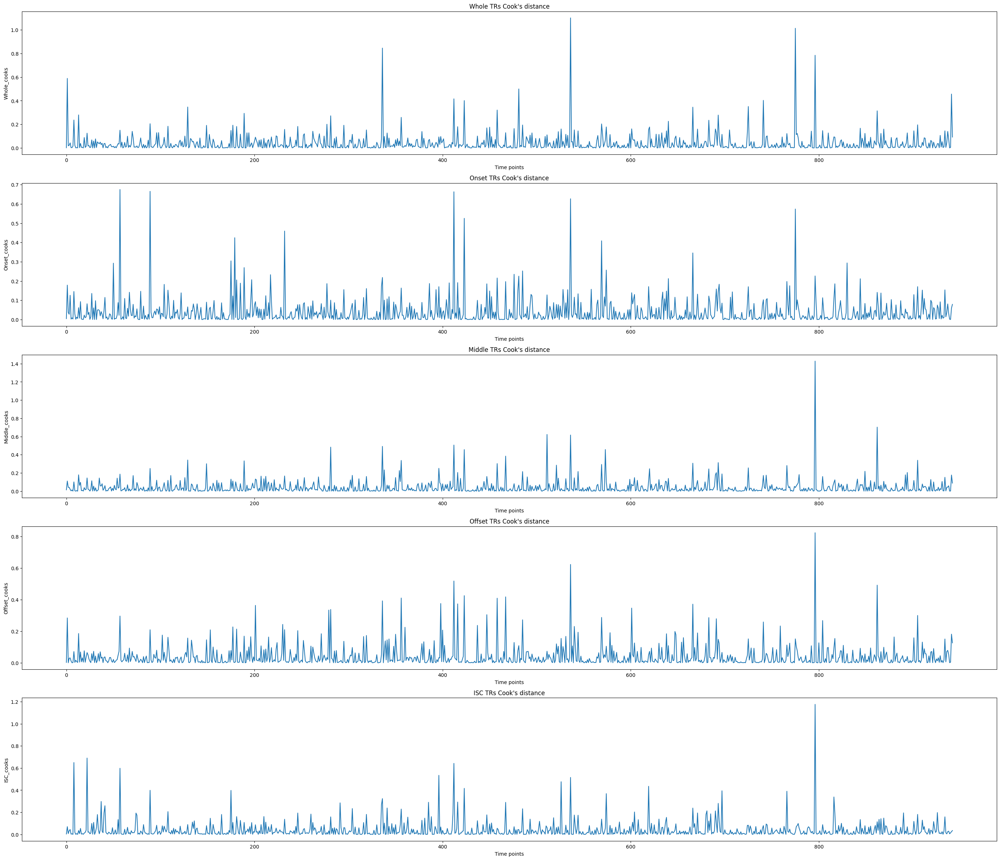

In [14]:
# Visualize cooks distance for each model.

fig, axs = plt.subplots(5, 1, figsize=(35, 30), sharex=False) 

time_points = np.arange(all_subs_events_df.shape[0])

sns.lineplot(data=all_subs_events_df, x=time_points, y='Whole_cooks', ax=axs[0])
axs[0].set_title("Whole TRs Cook's distance")
axs[0].set_xlabel("Time points")

sns.lineplot(data=all_subs_events_df, x=time_points, y='Onset_cooks', ax=axs[1])
axs[1].set_title("Onset TRs Cook's distance")
axs[1].set_xlabel("Time points")

sns.lineplot(data=all_subs_events_df, x=time_points, y='Middle_cooks', ax=axs[2])
axs[2].set_title("Middle TRs Cook's distance")
axs[2].set_xlabel("Time points")

sns.lineplot(data=all_subs_events_df, x=time_points, y='Offset_cooks', ax=axs[3])
axs[3].set_title("Offset TRs Cook's distance")
axs[3].set_xlabel("Time points")

sns.lineplot(data=all_subs_events_df, x=time_points, y='ISC_cooks', ax=axs[4])
axs[4].set_title("ISC TRs Cook's distance")
axs[4].set_xlabel("Time points")



In [15]:
#all_subs_events_df.reset_index(drop=False, inplace=True)
#all_subs_events_df

In [16]:
drop_threshold = 1

# Drop rows with Cook's distance higher than the threshold.
all_subs_events_df = all_subs_events_df[all_subs_events_df['Whole_cooks'] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df['Onset_cooks'] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df['Middle_cooks'] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df['Offset_cooks'] < drop_threshold]
all_subs_events_df = all_subs_events_df[all_subs_events_df['ISC_cooks'] < drop_threshold]

print("The shape of the dataframe after dropping rows is: ", all_subs_events_df.shape)

The shape of the dataframe after dropping rows is:  (940, 125)


In [17]:
# np.set_printoptions(suppress=False)

# drop_threshold = 1

# rows_to_drop_whole = np.array(all_subs_events_df[all_subs_events_df["Whole_cooks"] > drop_threshold].index)
# rows_to_drop_onset = np.array(all_subs_events_df[all_subs_events_df["Onset_cooks"] > drop_threshold].index)
# rows_to_drop_middle = np.array(all_subs_events_df[all_subs_events_df["Middle_cooks"] > drop_threshold].index)
# rows_to_drop_offset = np.array(all_subs_events_df[all_subs_events_df["Offset_cooks"] > drop_threshold].index)
# rows_to_drop_ISC = np.array(all_subs_events_df[all_subs_events_df["ISC_cooks"] > drop_threshold].index)

# rows_to_drop = np.concatenate((rows_to_drop_whole, rows_to_drop_onset, rows_to_drop_middle, rows_to_drop_offset, rows_to_drop_ISC), axis=0)
# rows_to_drop = np.unique(rows_to_drop).tolist()

# # Check if all indices exist
# #indices_exist = all(idx in all_subs_events_df.index for idx in rows_to_drop)

# #print("All indices exist:", indices_exist)

# # Drop rows with high Cook's distance.
# print("Rows with outliers to drop: ", rows_to_drop)
# all_subs_events_df.drop(rows_to_drop, inplace=True)
# all_subs_events_df.reset_index(drop=True, inplace=True)

#print("The shape of the dataframe after dropping outliers is: ", all_subs_events_df.shape)

In [18]:

# # Drop outliers from positive arousal. 
# print("The shape of the dataframe before dropping outliers is: ", all_subs_events_df.shape)
# all_subs_events_df = all_subs_events_df[all_subs_events_df["Pos_arousal"] < 3]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["Pos_arousal_scaled"] < 1.45]
# print("The shape of the dataframe after dropping 'positive arousal' outliers is: ", all_subs_events_df.shape)

# # Drop outliers from negative arousal.
# all_subs_events_df = all_subs_events_df[all_subs_events_df["Neg_arousal"] < 1.5]
# print("The shape of the dataframe after dropping 'negative arousal' outliers is: ", all_subs_events_df.shape)

# # Drop outliers from watch score.

# # Drop outliers from NAcc.
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole"] < 0.4]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole"] > -0.4]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle"] > -0.6]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle"] < 0.6]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_neg_peak"] > -1.4]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_onset"] > -0.6]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_offset"] < 0.58]
# print("The shape of the dataframe after dropping 'NAcc' outliers is: ", all_subs_events_df.shape)

# # Drop outliers from AIns.
# all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_whole"] < 0.4]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_onset"] > -.8]
# print("The shape of the dataframe after dropping 'AIns' outliers is: ", all_subs_events_df.shape)

# # Drop outliers from MPFC.
# all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_middle"] < 1.2]
# all_subs_events_df.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_rm_outliers.csv')

# # Drop outliers from delta peaks.
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_delta_peak"] < 100]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_delta_peak"] > -100]




In [19]:
# Separate files based on type of trailer. 
all_subs_events_df.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_ISC.csv')

all_subs_events_horror = all_subs_events_df[all_subs_events_df["Type"] == "Horror"]
all_subs_events_horror.reset_index(drop=True, inplace=True)
all_subs_events_horror.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_ISC_Horror.csv')

all_subs_events_comedy = all_subs_events_df[all_subs_events_df["Type"] == "Comedy"]
all_subs_events_comedy.reset_index(drop=True, inplace=True)
all_subs_events_comedy.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_ISC_Comedy.csv')


In [20]:
all_subs_events_horror.head()

,Participant,Trailer,Type,Onset,Offset,Duration,W_score,A_score,F_score,NAcc_onset,...,NAcc_AIns_ISFC,AIns_NAcc_ISFC,MPFC_NAcc_ISFC,MPFC_AIns_ISFC,Participant_cooks,Whole_cooks,Onset_cooks,Middle_cooks,Offset_cooks,ISC_cooks
0,sub-01,rh6,Horror,12.0,42.0,30,3,3,2,-0.034952,...,0.186010,0.170274,0.077826,0.011644,sub-01,0.001240,0.004633,0.014082,0.002295,0.003493
1,sub-01,uh1,Horror,60.0,90.0,30,1,3,3,0.246150,...,-0.132995,0.075989,-0.116243,-0.018230,sub-01,0.589086,0.178640,0.110886,0.284112,0.069854
2,sub-01,rh2,Horror,152.0,182.0,30,3,2,2,-0.184960,...,0.068391,-0.135924,-0.081173,0.048070,sub-01,0.022770,0.027226,0.041546,0.028884,0.034063
3,sub-01,rh1,Horror,196.0,226.0,30,4,3,2,0.108128,...,-0.427495,0.538147,0.492223,0.089027,sub-01,0.042681,0.125888,0.020063,0.030645,0.043769
4,sub-01,rh9,Horror,332.0,362.0,30,2,2,2,0.193406,...,0.437323,-0.219363,-0.646556,0.206187,sub-01,0.015067,0.002496,0.000474,0.001537,0.000004


# Visualize data 

## Behavioral Associations. 

The correlation between W_score and Pos_arousal is: 0.5988 with a p-value of: 1.61981561965332e-92
The correlation between W_score and Neg_arousal is: -0.1705 with a p-value of: 1.4374583309297706e-07


Text(-1, -2, 'r= -0.1705; p-value: 1.4374583309297706e-07')

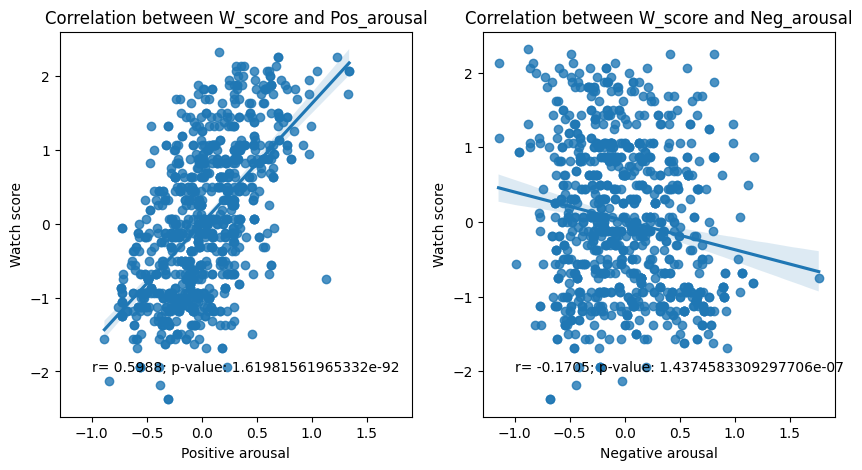

In [21]:
# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for both types of trailers. 
W_PA_All_corr = pearsonr(all_subs_events_df["W_score_scaled"], all_subs_events_df["Pos_arousal_scaled"])
W_NA_All_corr = pearsonr(all_subs_events_df["W_score_scaled"], all_subs_events_df["Neg_arousal_scaled"])

print("The correlation between W_score and Pos_arousal is: " + str(round(W_PA_All_corr[0], 4)) + " with a p-value of: " + str((W_PA_All_corr[1])))
print("The correlation between W_score and Neg_arousal is: " + str(round(W_NA_All_corr[0], 4)) + " with a p-value of: " + str((W_NA_All_corr[1])))

fig, axs = plt.subplots(1, 2, figsize=(10, 5), sharex=True)

# Plot the correlation between W_score and Pos_arousal.
W_PA_plot = sns.regplot(data=all_subs_events_df, x="Pos_arousal_scaled", y="W_score_scaled", ax=axs[0])
W_PA_plot.set_title("Correlation between W_score and Pos_arousal")
W_PA_plot.set_xlabel("Positive arousal")
W_PA_plot.set_ylabel("Watch score")

# Plot the correlation between W_score and Neg_arousal.
W_NA_plot = sns.regplot(data=all_subs_events_df, x="Neg_arousal_scaled", y="W_score_scaled", ax=axs[1])
W_NA_plot.set_title("Correlation between W_score and Neg_arousal")
W_NA_plot.set_xlabel("Negative arousal")
W_NA_plot.set_ylabel("Watch score")

# Add annotation to the plot. 
W_PA_string = "r= " + str(round(W_PA_All_corr[0], 4)) + "; p-value: " + str((W_PA_All_corr[1]))
axs[0].text(s=W_PA_string, x=-1, y=-2, fontsize=10)
W_NA_string = "r= " + str(round(W_NA_All_corr[0], 4)) + "; p-value: " + str((W_NA_All_corr[1]))
axs[1].text(s=W_NA_string, x=-1, y=-2, fontsize=10)


In [22]:
# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for comedy trailers.
W_PA_comedy_corr = pearsonr(all_subs_events_comedy["W_score_scaled"], all_subs_events_comedy["Pos_arousal_scaled"])
W_NA_comedy_corr = pearsonr(all_subs_events_comedy["W_score_scaled"], all_subs_events_comedy["Neg_arousal_scaled"])

print("The correlation between W_score and Pos_arousal for comedy trailers is: " + str(round(W_PA_comedy_corr[0], 4)) + " with a p-value of: " + str((W_PA_comedy_corr[1])))
print("The correlation between W_score and Neg_arousal for comedy trailers is: " + str(round(W_NA_comedy_corr[0], 4)) + " with a p-value of: " + str((W_NA_comedy_corr[1])))

# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for horror trailers.
W_PA_horror_corr = pearsonr(all_subs_events_horror["W_score_scaled"], all_subs_events_horror["Pos_arousal_scaled"])
W_NA_horror_corr = pearsonr(all_subs_events_horror["W_score_scaled"], all_subs_events_horror["Neg_arousal_scaled"])

print("\nThe correlation between W_score and Pos_arousal for horror trailers is: " + str(round(W_PA_horror_corr[0], 4)) + " with a p-value of: " + str((W_PA_horror_corr[1])))
print("The correlation between W_score and Neg_arousal for horror trailers is: " + str(round(W_NA_horror_corr[0], 4)) + " with a p-value of: " + str((W_NA_horror_corr[1])))


The correlation between W_score and Pos_arousal for comedy trailers is: 0.6575 with a p-value of: 6.767898780210667e-60
The correlation between W_score and Neg_arousal for comedy trailers is: -0.0072 with a p-value of: 0.8758948783010594

The correlation between W_score and Pos_arousal for horror trailers is: 0.4593 with a p-value of: 9.495308836739138e-26
The correlation between W_score and Neg_arousal for horror trailers is: -0.098 with a p-value of: 0.03432834903375299


Text(-0.8, -2.5, 'H r= 0.4593; p-value: 9.495308836739138e-26')

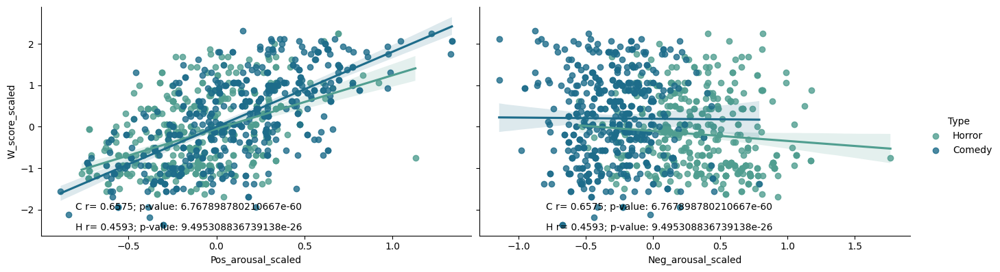

In [23]:

all_participants_cleaned_df = pd.read_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_ISC.csv')

W_PA_NA_bothTrailers_behavioral_plot = sns.pairplot(
     all_participants_cleaned_df,
     kind="reg",
     x_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"],
     y_vars=["W_score_scaled"], 
     palette="crest",
     hue="Type",
     height=4,
     aspect=1.7)

W_comedy_PA_string = "C r= " + str(round(W_PA_comedy_corr[0], 4)) + "; p-value: " + str((W_PA_comedy_corr[1]))
W_horror_PA_string = "H r= " + str(round(W_PA_horror_corr[0], 4)) + "; p-value: " + str((W_PA_horror_corr[1]))
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 0].text(s=W_comedy_PA_string, x=-.8, y=-2, fontsize=10)
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 0].text(s=W_horror_PA_string, x=-.8, y=-2.5, fontsize=10)

W_comedy_NA_string = "C r= " + str(round(W_PA_comedy_corr[0], 4)) + "; p-value: " + str((W_PA_comedy_corr[1]))
W_horror_NA_string = "H r= " + str(round(W_PA_horror_corr[0], 4)) + "; p-value: " + str((W_PA_horror_corr[1]))
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 1].text(s=W_comedy_NA_string, x=-.8, y=-2, fontsize=10)
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 1].text(s=W_horror_NA_string, x=-.8, y=-2.5, fontsize=10)

/var/folders/0z/1yt2h6410kb7_mgghf4q28z00000gn/T/ipykernel_3926/1435780750.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=Individuals_mean_horror_df, y="W_score_scaled", palette="viridis", width=0.3, ax=axs[0, 0])
/var/folders/0z/1yt2h6410kb7_mgghf4q28z00000gn/T/ipykernel_3926/1435780750.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=Individuals_mean_horror_df, y="W_score_scaled_std", palette="viridis", width=0.3, ax=axs[0, 1])
/var/folders/0z/1yt2h6410kb7_mgghf4q28z00000gn/T/ipykernel_3926/1435780750.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` f

<Axes: ylabel='W_score_scaled_std'>

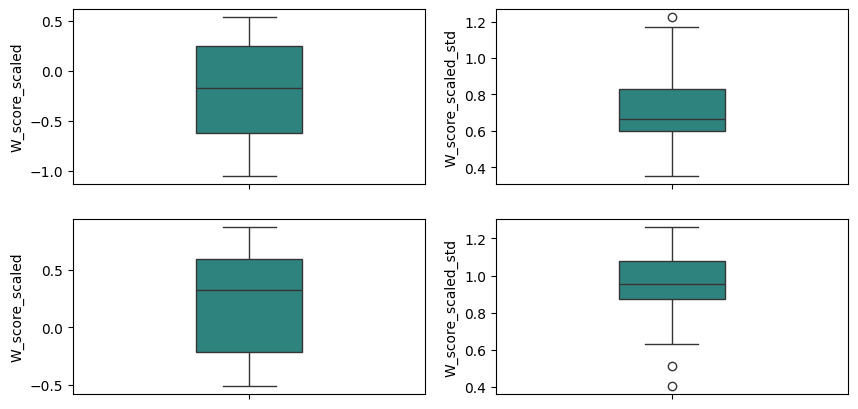

In [24]:
# Catching participants who consistently disliked horror/comedy movies. 
Individuals_mean_comedy_df = all_subs_events_comedy.groupby("Participant", as_index=False, dropna=False).mean()
Individuals_std_comedy_df = all_subs_events_comedy.groupby("Participant", as_index=False, dropna=False).std()
Individuals_mean_comedy_df["W_score_scaled_std"] = Individuals_std_comedy_df["W_score_scaled"]

Individuals_mean_horror_df = all_subs_events_horror.groupby("Participant", as_index=False, dropna=False).mean()
Individuals_std_horror_df = all_subs_events_horror.groupby("Participant", as_index=False, dropna=False).std()
Individuals_mean_horror_df["W_score_scaled_std"] = Individuals_std_horror_df["W_score_scaled"]

fig, axs = plt.subplots(2, 2, figsize=(10, 5), sharex=True)
#fig.suptitle(" of Positive and Negative arousal for both types of trailers")
sns.boxplot(data=Individuals_mean_horror_df, y="W_score_scaled", palette="viridis", width=0.3, ax=axs[0, 0])
sns.boxplot(data=Individuals_mean_horror_df, y="W_score_scaled_std", palette="viridis", width=0.3, ax=axs[0, 1])

sns.boxplot(data=Individuals_mean_comedy_df, y="W_score_scaled", palette="viridis", width=0.3, ax=axs[1, 0])
sns.boxplot(data=Individuals_mean_comedy_df, y="W_score_scaled_std", palette="viridis", width=0.3, ax=axs[1, 1])



In [25]:
Individuals_mean_horror_df.loc[0, "W_score_scaled"]

-0.0625

In [26]:
# Get threshold for participants to exclude because the just don't like horror movies. 
Horror_w_threshold = Individuals_mean_horror_df["W_score_scaled"].describe()["25%"]
Dislike_horror_list = []

for participant_id in range(len(participants_list)):

    if Individuals_mean_horror_df.loc[participant_id, "W_score_scaled"] < Horror_w_threshold:
        Dislike_horror_list.append(participants_list[participant_id])

print("Participants who dislike horror movies: ", Dislike_horror_list)


Participants who dislike horror movies:  ['sub-03', 'sub-09', 'sub-18', 'sub-21', 'sub-25', 'sub-28', 'sub-33', 'sub-37']


/var/folders/0z/1yt2h6410kb7_mgghf4q28z00000gn/T/ipykernel_3926/2937040998.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=all_subs_events_df, y="Pos_arousal_scaled", x="Type", palette="viridis", ax=axs[0])
/var/folders/0z/1yt2h6410kb7_mgghf4q28z00000gn/T/ipykernel_3926/2937040998.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=all_subs_events_df, y="Neg_arousal_scaled", x="Type", palette="viridis", ax=axs[1])
/var/folders/0z/1yt2h6410kb7_mgghf4q28z00000gn/T/ipykernel_3926/2937040998.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  

<Axes: xlabel='Type', ylabel='W_score_scaled'>

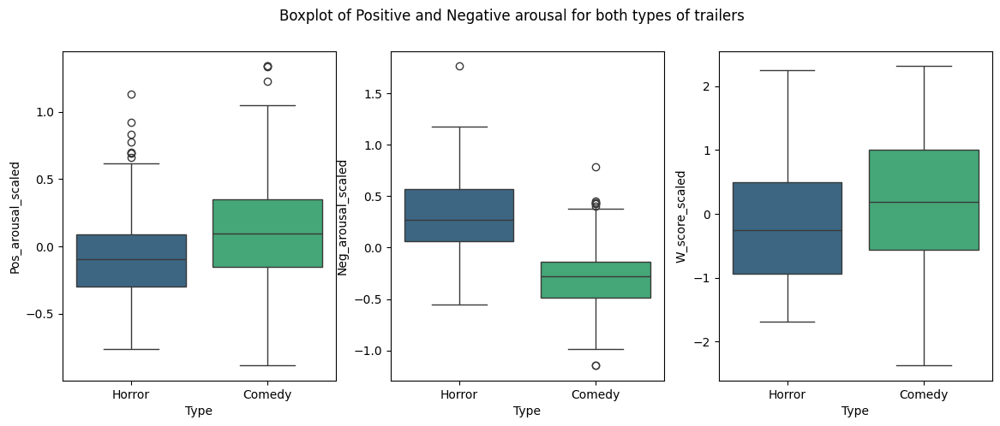

In [27]:
fig, axs = plt.subplots(1, 3, figsize=(14, 5), sharex=True)
fig.suptitle("Boxplot of Positive and Negative arousal for both types of trailers")
sns.boxplot(data=all_subs_events_df, y="Pos_arousal_scaled", x="Type", palette="viridis", ax=axs[0])
sns.boxplot(data=all_subs_events_df, y="Neg_arousal_scaled", x="Type", palette="viridis", ax=axs[1])
sns.boxplot(data=all_subs_events_df, y="W_score_scaled", x="Type", palette="viridis", ax=axs[2])


<Axes: xlabel='Pos_arousal_scaled', ylabel='Count'>

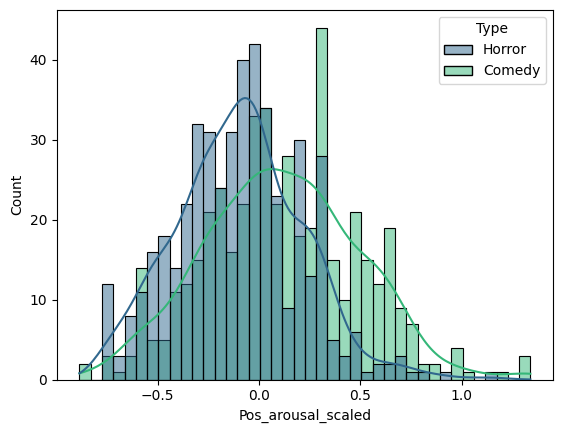

In [28]:
sns.histplot(data=all_subs_events_df, x="Pos_arousal_scaled", hue="Type", kde=True, palette="viridis", bins=40)



<Axes: xlabel='Neg_arousal_scaled', ylabel='Count'>

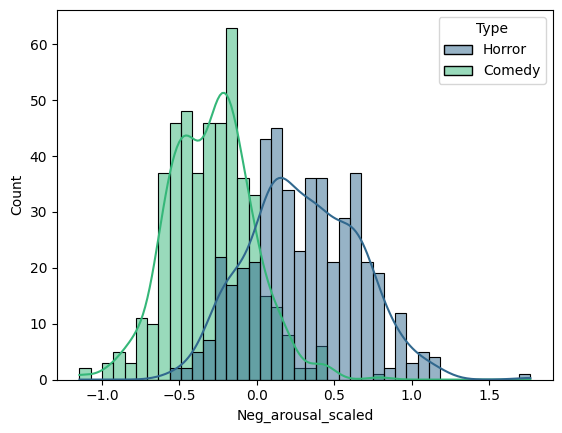

In [29]:
sns.histplot(data=all_subs_events_df, x="Neg_arousal_scaled", hue="Type", kde=True, palette="viridis", bins=40)

<Axes: xlabel='W_score_scaled', ylabel='Count'>

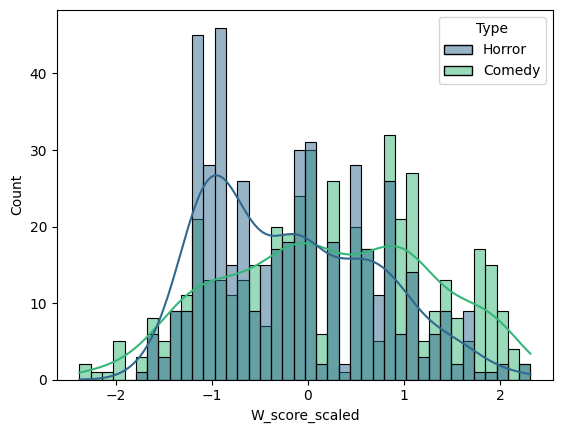

In [30]:
sns.histplot(data=all_subs_events_df, x="W_score_scaled", hue="Type", kde=True, palette="viridis", bins=40)

In [31]:
#sns.displot(data=all_subs_events_df, x="W_score", row="Trailer", kde=True, palette="viridis")

## Neural Activation Whole Average 

The correlation between NAcc_whole activation and positive arousal is: 0.0087 with a p-value of: 0.7900200379576244
The correlation between AIns_whole activation and positive arousal is: -0.03237 with a p-value of: 0.3215079393244017
The correlation between MPFC_whole activation and positive arousal is: -0.02101 with a p-value of: 0.5200176141312804

The correlation between NAcc_whole activation and negative arousal is: 0.08659 with a p-value of: 0.007899873372733157
The correlation between AIns_whole activation and negative arousal is: 0.23562 with a p-value of: 2.5234196587478213e-13
The correlation between MPFC_whole activation and negative arousal is: -0.01023 with a p-value of: 0.7541530608615404

The correlation between NAcc_whole activation and watch scores is: 0.0145 with a p-value of: 0.6570950561812531
The correlation between AIns_whole activation and watch scores is: -0.03185 with a p-value of: 0.3293478896458489
The correlation between MPFC_whole activation and watch scores

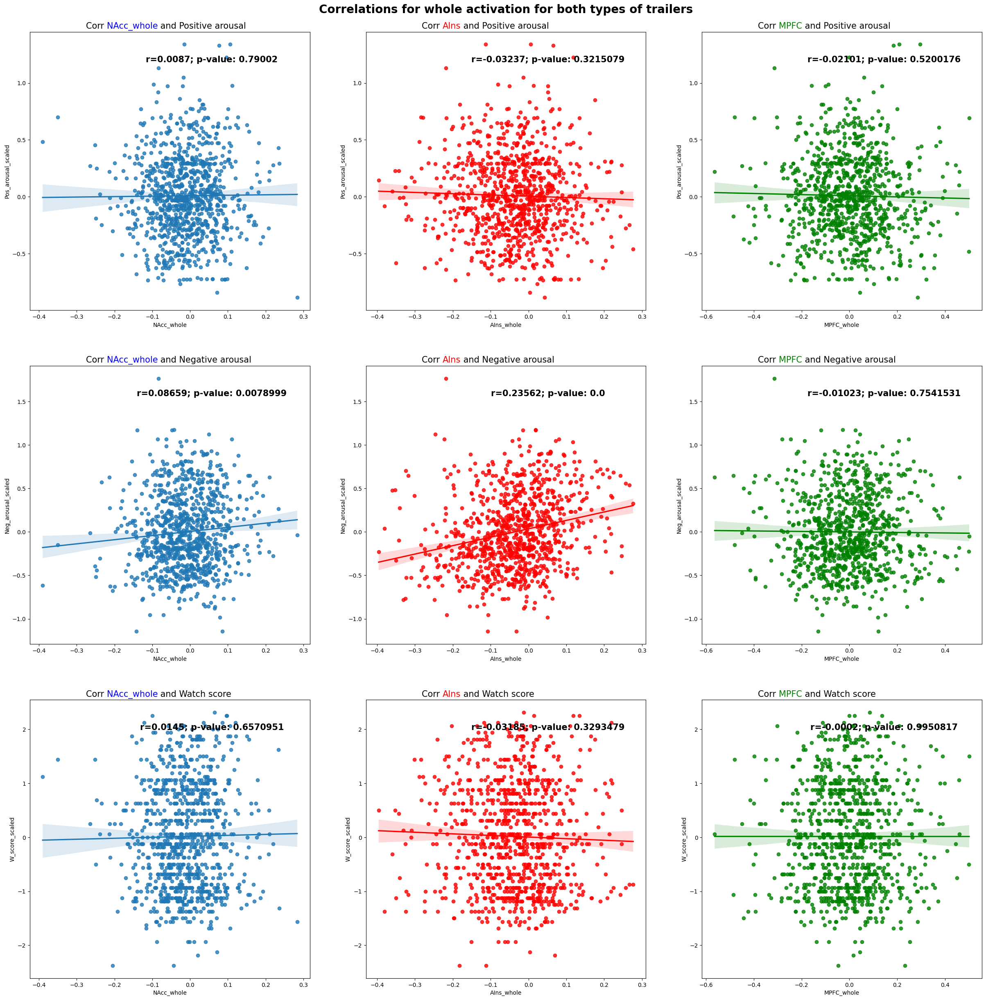

In [32]:
test_title = "Correlations for whole activation for both types of trailers"
compute_and_plot_corrs(all_participants_cleaned_df, "whole", test_title)

The correlation between NAcc_whole activation and positive arousal for Comedy trailers is: 0.03771 with a p-value of: 0.4132133364634854
The correlation between AIns_whole activation and positive arousal for Comedy trailers is: 0.09067 with a p-value of: 0.04874753367800857
The correlation between MPFC_whole activation and positive arousal for Comedy trailers is: -0.04514 with a p-value of: 0.32727609915784106

The correlation between NAcc_whole activation and negative arousal for Comedy trailers is: 0.07056 with a p-value of: 0.12539528591089508
The correlation between AIns_whole activation and negative arousal for Comedy trailers is: 0.08603 with a p-value of: 0.06154120111366896
The correlation between MPFC_whole activation and negative arousal for Comedy trailers is: 0.04432 with a p-value of: 0.33611515599449615

The correlation between NAcc_whole activation and watch scores for Comedy trailers is: 0.0489 with a p-value of: 0.2885290132664715
The correlation between AIns_whole act

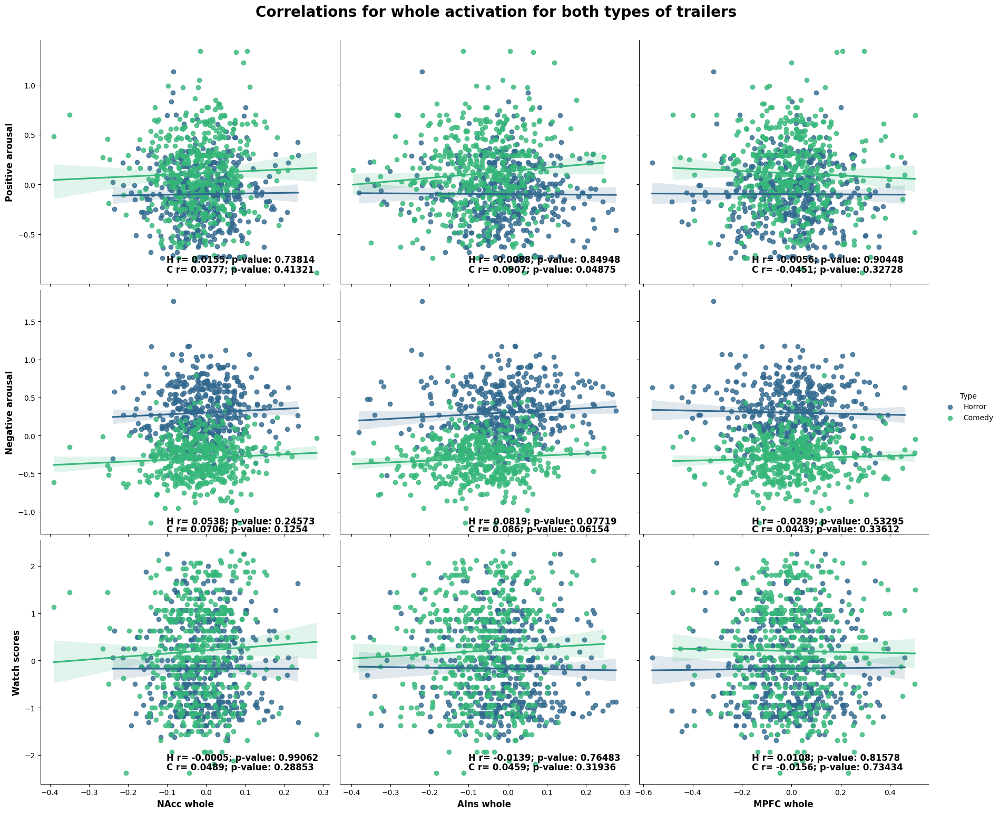

In [33]:

compute_and_plot_both_corrs(all_participants_cleaned_df, all_subs_events_comedy, all_subs_events_horror, "whole", "Correlations for whole activation for both types of trailers")


## Neural Activation Offset 

The correlation between NAcc_offset activation and positive arousal is: -0.01931 with a p-value of: 0.554270303784234
The correlation between AIns_offset activation and positive arousal is: -0.02876 with a p-value of: 0.37840926574533174
The correlation between MPFC_offset activation and positive arousal is: 0.00139 with a p-value of: 0.9660559054918505

The correlation between NAcc_offset activation and negative arousal is: 0.0312 with a p-value of: 0.33937515085140213
The correlation between AIns_offset activation and negative arousal is: 0.19387 with a p-value of: 2.058456884193645e-09
The correlation between MPFC_offset activation and negative arousal is: -0.01199 with a p-value of: 0.7134784840825433

The correlation between NAcc_offset activation and watch scores is: 0.01336 with a p-value of: 0.6824656118069947
The correlation between AIns_offset activation and watch scores is: -0.05527 with a p-value of: 0.09034090941514406
The correlation between MPFC_offset activation and wat

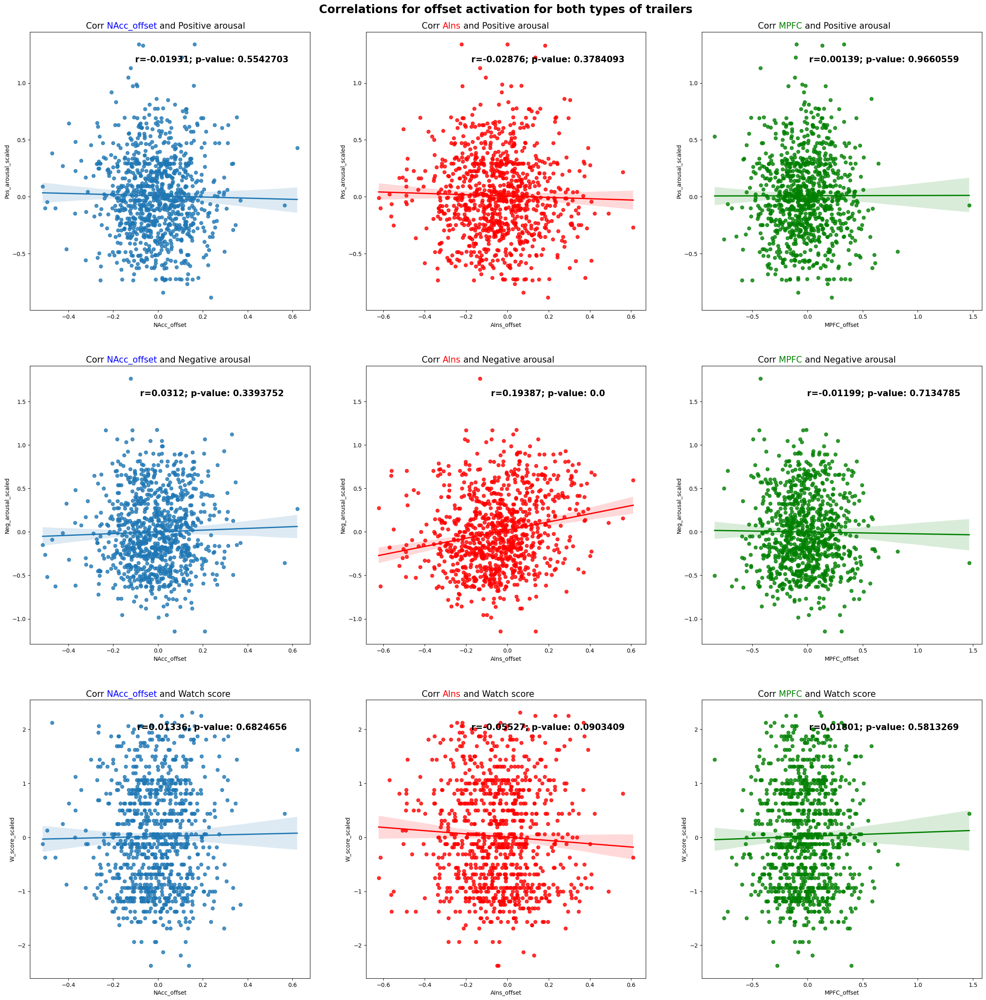

In [34]:
offset_title = "Correlations for offset activation for both types of trailers"
compute_and_plot_corrs(all_participants_cleaned_df, "offset", offset_title)

The correlation between NAcc_offset activation and positive arousal for Comedy trailers is: -0.06812 with a p-value of: 0.1390624599133508
The correlation between AIns_offset activation and positive arousal for Comedy trailers is: 0.0499 with a p-value of: 0.2787351180791682
The correlation between MPFC_offset activation and positive arousal for Comedy trailers is: 0.00118 with a p-value of: 0.9795415577898174

The correlation between NAcc_offset activation and negative arousal for Comedy trailers is: -0.01081 with a p-value of: 0.8146657403923562
The correlation between AIns_offset activation and negative arousal for Comedy trailers is: 0.06301 with a p-value of: 0.17125978545226567
The correlation between MPFC_offset activation and negative arousal for Comedy trailers is: 0.01897 with a p-value of: 0.6807531091725006

The correlation between NAcc_offset activation and watch scores for Comedy trailers is: -0.03725 with a p-value of: 0.41895373122679475
The correlation between AIns_off

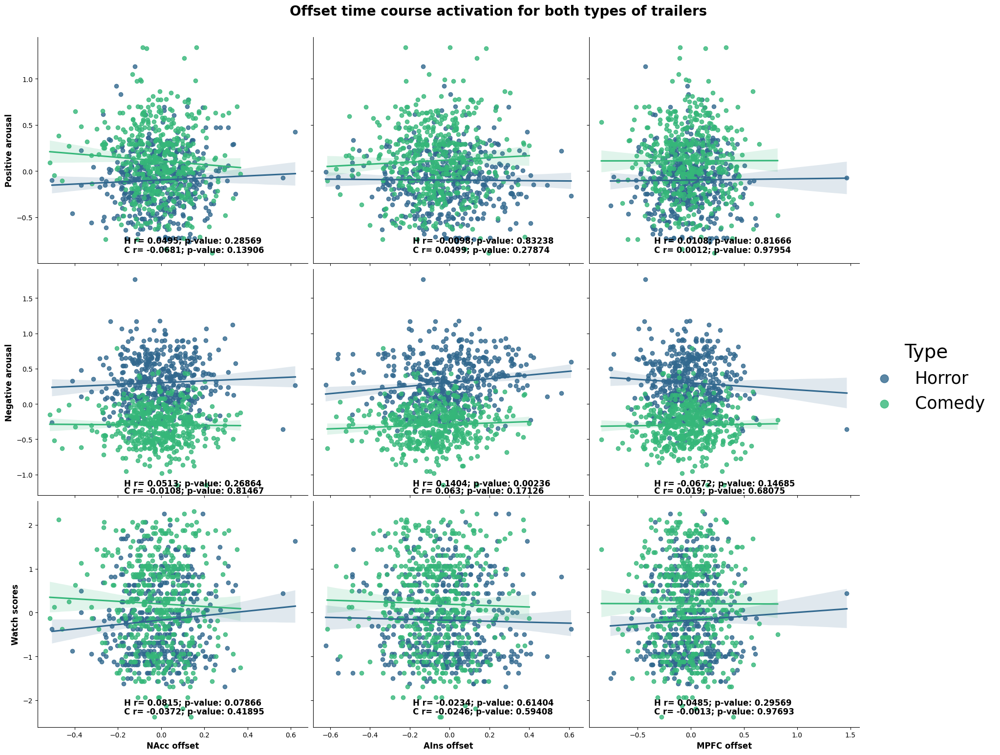

In [35]:
offset_title = 'Offset time course activation for both types of trailers'
compute_and_plot_both_corrs(all_participants_cleaned_df, all_subs_events_comedy, all_subs_events_horror, "offset", offset_title)


# Neural activation middle

The correlation between NAcc_middle activation and positive arousal is: -0.02191 with a p-value of: 0.5022334081719801
The correlation between AIns_middle activation and positive arousal is: -0.04453 with a p-value of: 0.172575103028179
The correlation between MPFC_middle activation and positive arousal is: -0.07632 with a p-value of: 0.019270668551910862

The correlation between NAcc_middle activation and negative arousal is: 0.0782 with a p-value of: 0.016483914865123725
The correlation between AIns_middle activation and negative arousal is: 0.18401 with a p-value of: 1.3246963304563944e-08
The correlation between MPFC_middle activation and negative arousal is: -0.01628 with a p-value of: 0.6181939625897117

The correlation between NAcc_middle activation and watch scores is: -0.00779 with a p-value of: 0.8114477585242135
The correlation between AIns_middle activation and watch scores is: -0.02398 with a p-value of: 0.462776121948543
The correlation between MPFC_middle activation and 

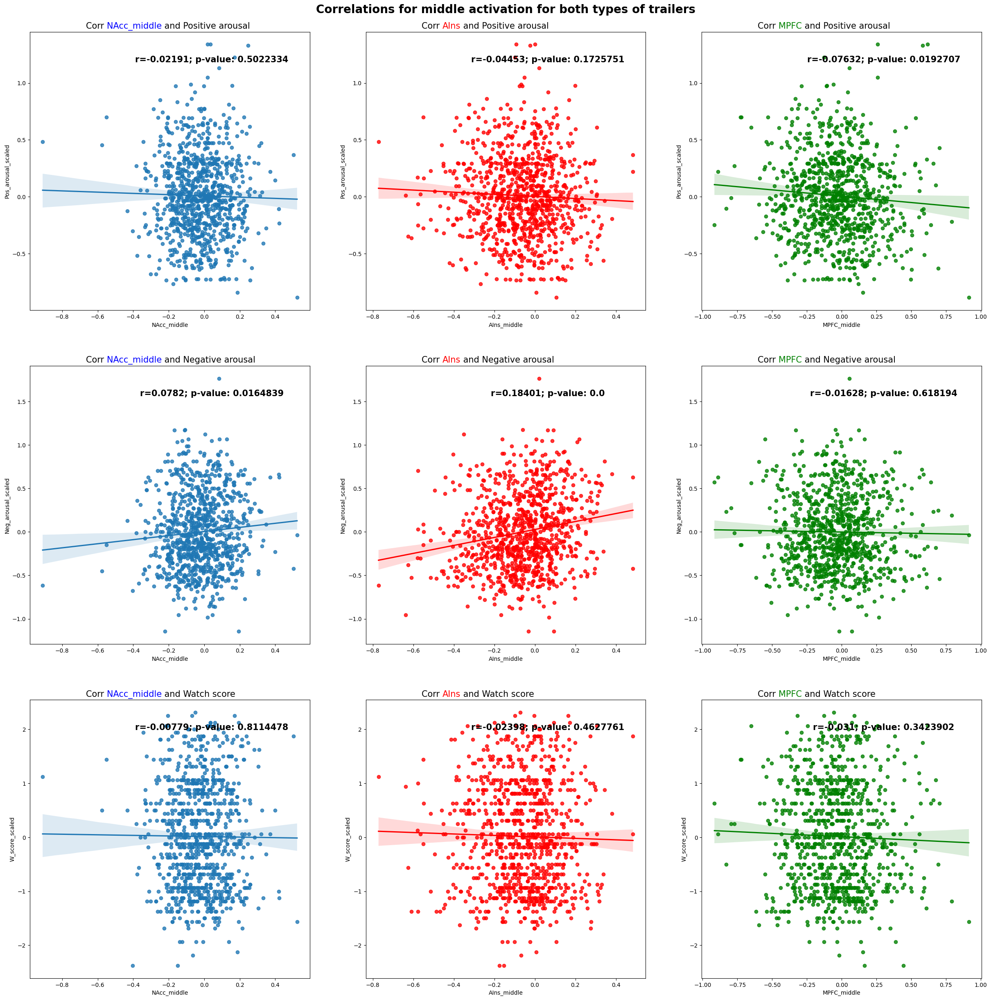

In [36]:
middle_title = "Correlations for middle activation for both types of trailers"
compute_and_plot_corrs(all_participants_cleaned_df, "middle", middle_title)

The correlation between NAcc_middle activation and positive arousal for Comedy trailers is: -0.00195 with a p-value of: 0.9662458821841811
The correlation between AIns_middle activation and positive arousal for Comedy trailers is: 0.01102 with a p-value of: 0.8111526962997088
The correlation between MPFC_middle activation and positive arousal for Comedy trailers is: -0.09012 with a p-value of: 0.050133507777537493

The correlation between NAcc_middle activation and negative arousal for Comedy trailers is: 0.07414 with a p-value of: 0.1073153286194674
The correlation between AIns_middle activation and negative arousal for Comedy trailers is: 0.05198 with a p-value of: 0.25921733937655145
The correlation between MPFC_middle activation and negative arousal for Comedy trailers is: -0.01214 with a p-value of: 0.792222133770474

The correlation between NAcc_middle activation and watch scores for Comedy trailers is: 0.04827 with a p-value of: 0.294800702442706
The correlation between AIns_mid

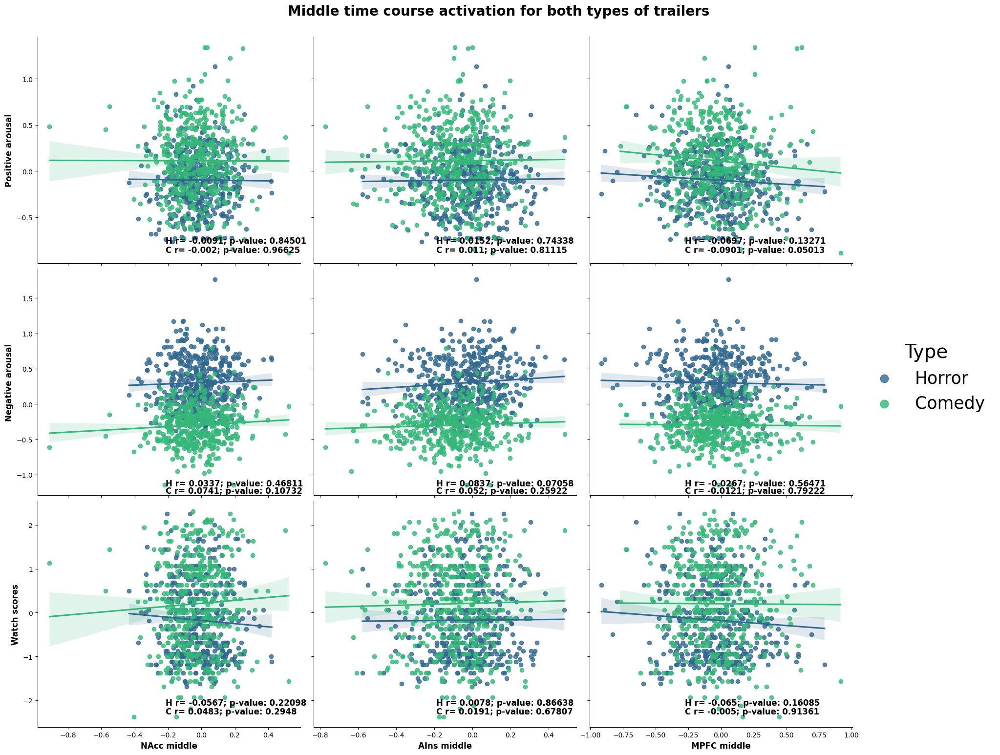

In [37]:
middle_title = 'Middle time course activation for both types of trailers'
compute_and_plot_both_corrs(all_participants_cleaned_df, all_subs_events_comedy, all_subs_events_horror, "middle", middle_title)

## Neural activation onset

The correlation between NAcc_onset activation and positive arousal is: 0.05416 with a p-value of: 0.09703995064316391
The correlation between AIns_onset activation and positive arousal is: 0.01533 with a p-value of: 0.6388182749577557
The correlation between MPFC_onset activation and positive arousal is: 0.03662 with a p-value of: 0.26198695801913696

The correlation between NAcc_onset activation and negative arousal is: 0.03472 with a p-value of: 0.28759454743245605
The correlation between AIns_onset activation and negative arousal is: 0.04511 with a p-value of: 0.16703106462911518
The correlation between MPFC_onset activation and negative arousal is: 0.00913 with a p-value of: 0.7799021029149807

The correlation between NAcc_onset activation and watch scores is: 0.01898 with a p-value of: 0.5610474021859504
The correlation between AIns_onset activation and watch scores is: 0.02303 with a p-value of: 0.48057000616950535
The correlation between MPFC_onset activation and watch scores is

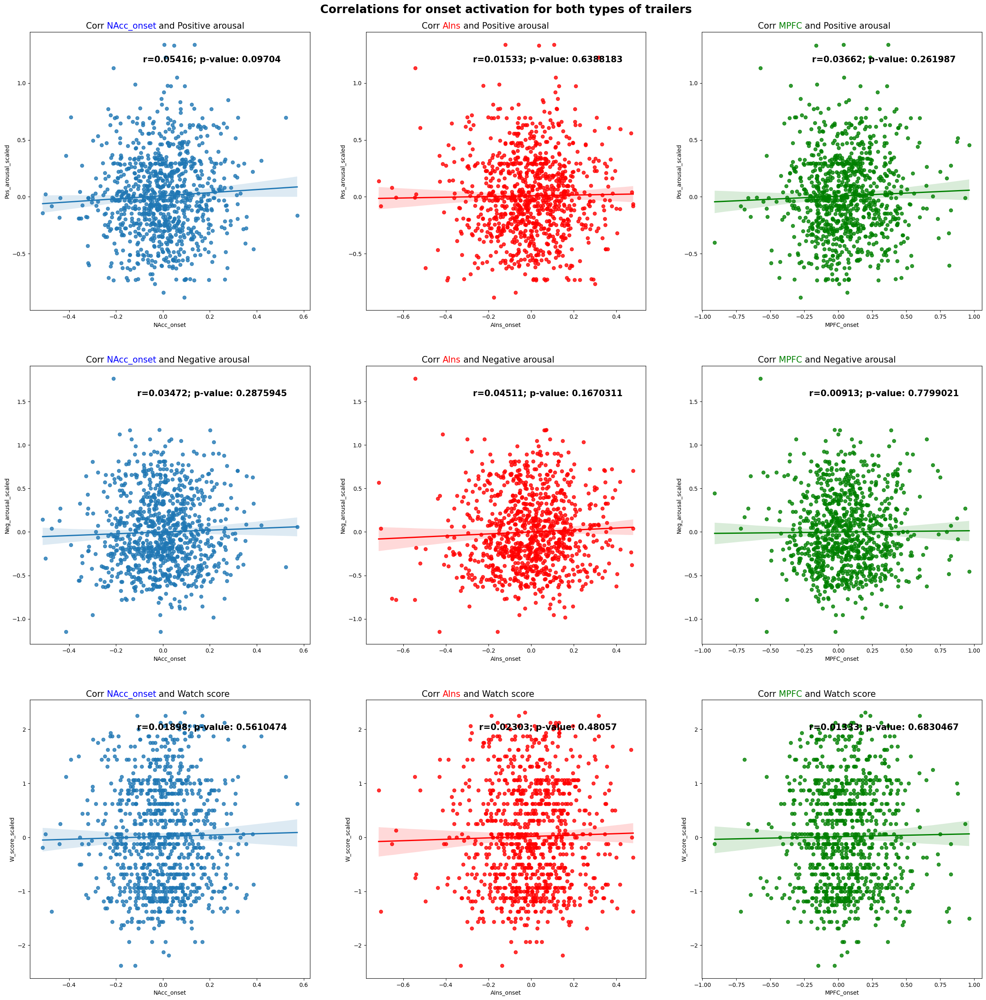

In [38]:
onset_title = "Correlations for onset activation for both types of trailers"
compute_and_plot_corrs(all_participants_cleaned_df, "onset", onset_title)

The correlation between NAcc_onset activation and positive arousal for Comedy trailers is: 0.12845 with a p-value of: 0.005144556337030989
The correlation between AIns_onset activation and positive arousal for Comedy trailers is: 0.09733 with a p-value of: 0.03432151729599951
The correlation between MPFC_onset activation and positive arousal for Comedy trailers is: 0.00506 with a p-value of: 0.9126357466706599

The correlation between NAcc_onset activation and negative arousal for Comedy trailers is: 0.05028 with a p-value of: 0.27509493469982654
The correlation between AIns_onset activation and negative arousal for Comedy trailers is: 0.03682 with a p-value of: 0.42430615995101917
The correlation between MPFC_onset activation and negative arousal for Comedy trailers is: 0.07847 with a p-value of: 0.08824711599542016

The correlation between NAcc_onset activation and watch scores for Comedy trailers is: 0.06567 with a p-value of: 0.15385386434095363
The correlation between AIns_onset a

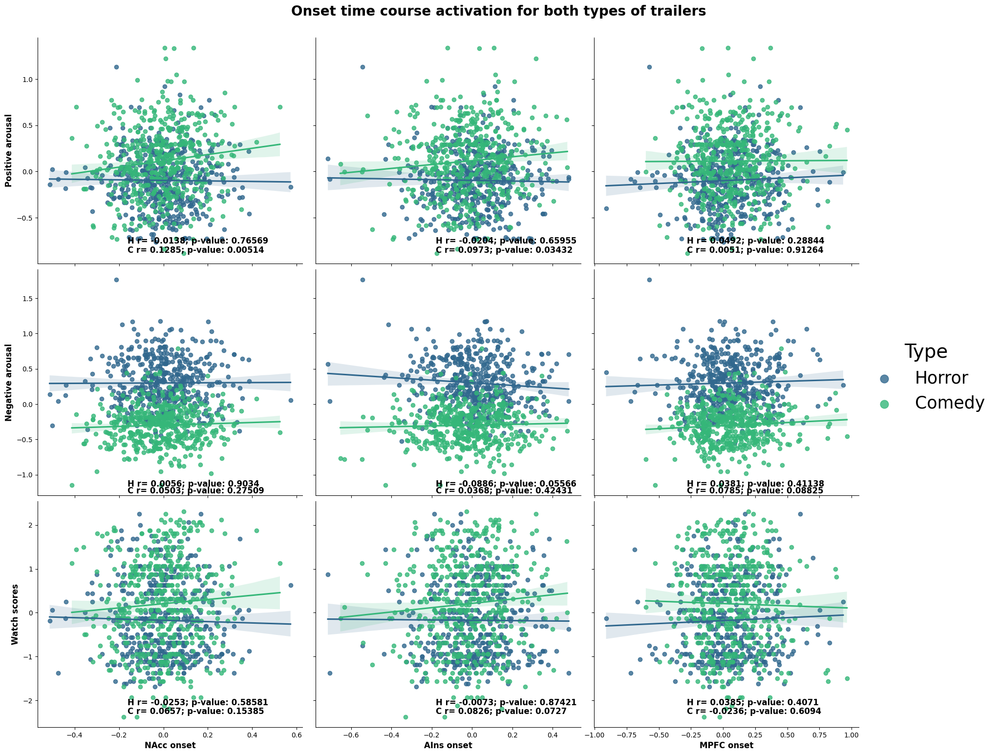

In [39]:
onset_title = 'Onset time course activation for both types of trailers'
compute_and_plot_both_corrs(all_participants_cleaned_df, all_subs_events_comedy, all_subs_events_horror, "onset", onset_title)

## Individual peak (max)

The correlation between NAcc_ind_peaks_pos activation and positive arousal is: 0.04197 with a p-value of: 0.19856058206905153
The correlation between AIns_ind_peaks_pos activation and positive arousal is: 0.00208 with a p-value of: 0.9491589426774164
The correlation between MPFC_ind_peaks_pos activation and positive arousal is: -0.01192 with a p-value of: 0.7150736282352858

The correlation between NAcc_ind_peaks_pos activation and negative arousal is: 0.0513 with a p-value of: 0.11600210141323279
The correlation between AIns_ind_peaks_pos activation and negative arousal is: 0.09208 with a p-value of: 0.004724652200225757
The correlation between MPFC_ind_peaks_pos activation and negative arousal is: 0.02809 with a p-value of: 0.38963481630023916

The correlation between NAcc_ind_peaks_pos activation and watch scores is: 0.03644 with a p-value of: 0.26439390500387416
The correlation between AIns_ind_peaks_pos activation and watch scores is: 0.02808 with a p-value of: 0.3897789158538337


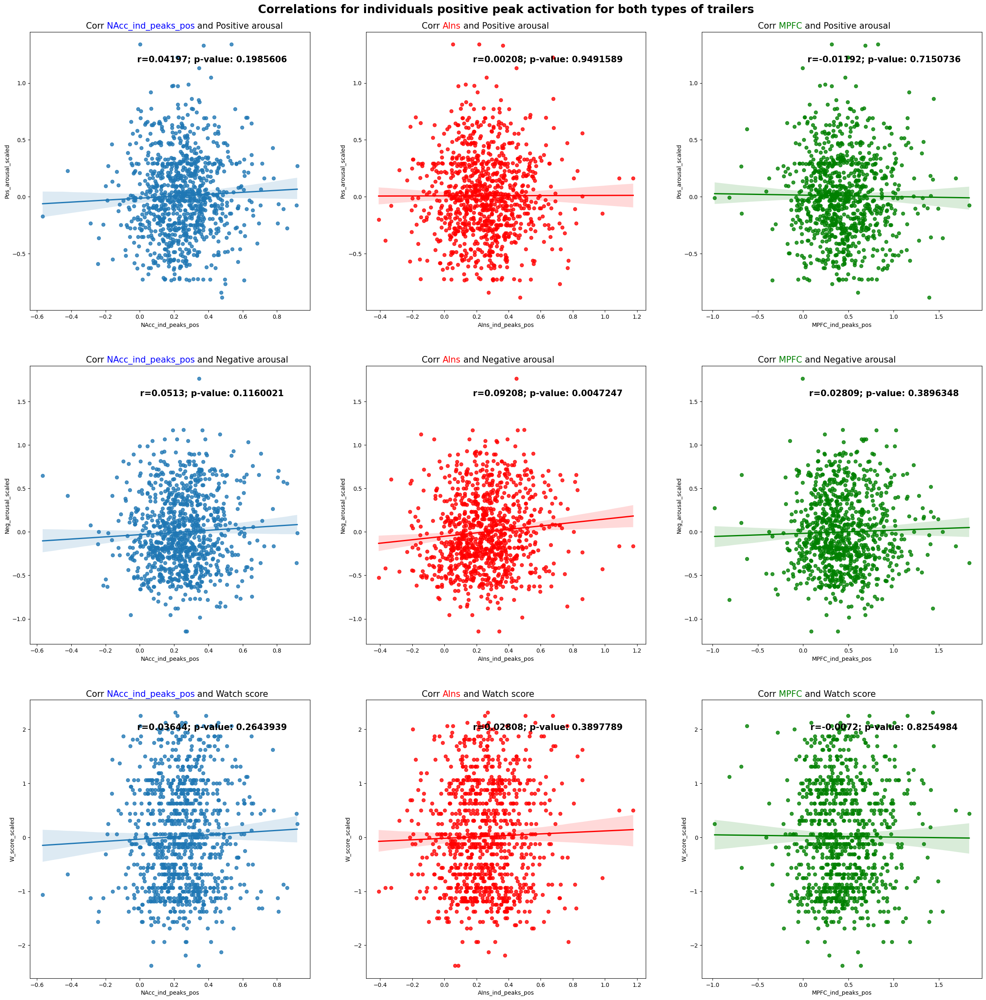

In [71]:
pos_peak_title = "Correlations for individuals positive peak activation for both types of trailers"
compute_and_plot_corrs(all_participants_cleaned_df, "ind_peaks_pos", pos_peak_title)

The correlation between NAcc_ind_peaks_pos activation and positive arousal for Comedy trailers is: 0.09381 with a p-value of: 0.04142725756645239
The correlation between AIns_ind_peaks_pos activation and positive arousal for Comedy trailers is: 0.0479 with a p-value of: 0.29851503816179253
The correlation between MPFC_ind_peaks_pos activation and positive arousal for Comedy trailers is: -0.04498 with a p-value of: 0.3289424447731602

The correlation between NAcc_ind_peaks_pos activation and negative arousal for Comedy trailers is: -0.05882 with a p-value of: 0.20160842302270565
The correlation between AIns_ind_peaks_pos activation and negative arousal for Comedy trailers is: 0.03228 with a p-value of: 0.48372868008619857
The correlation between MPFC_ind_peaks_pos activation and negative arousal for Comedy trailers is: 0.02259 with a p-value of: 0.6240324146486413

The correlation between NAcc_ind_peaks_pos activation and watch scores for Comedy trailers is: 0.10758 with a p-value of: 0

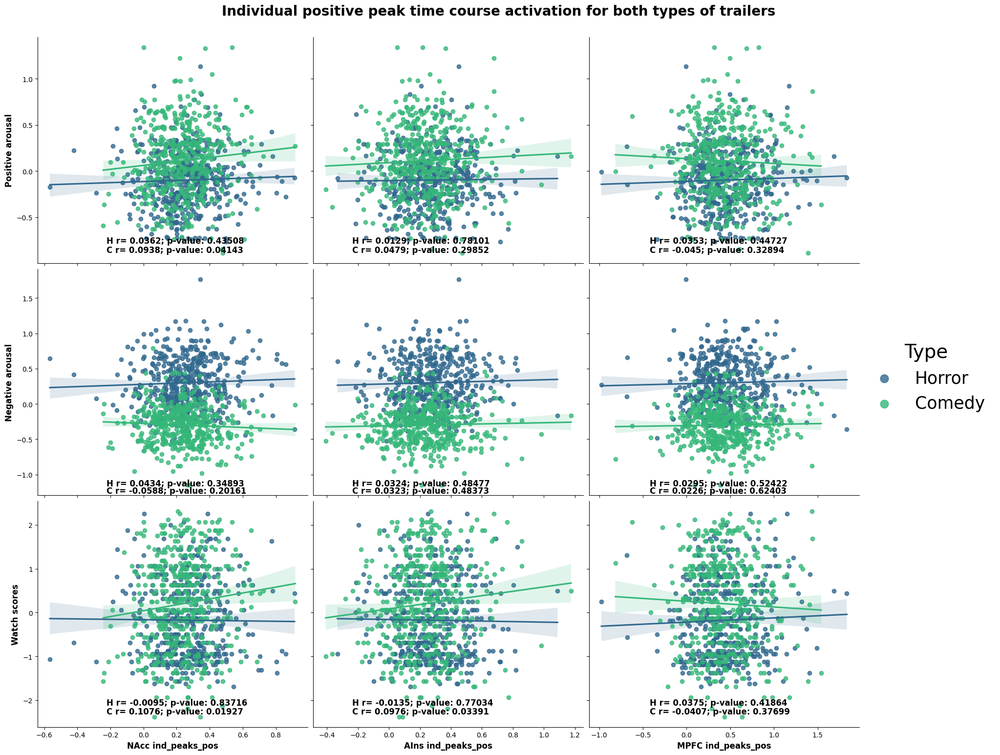

In [73]:
pos_peak_title = 'Individual positive peak time course activation for both types of trailers'
compute_and_plot_both_corrs(all_participants_cleaned_df, all_subs_events_comedy, all_subs_events_horror, "ind_peaks_pos", pos_peak_title)

## Individual peaks (min)

The correlation between NAcc_ind_peaks_neg activation and positive arousal is: 0.03467 with a p-value of: 0.28829848167273064
The correlation between AIns_ind_peaks_neg activation and positive arousal is: -0.0376 with a p-value of: 0.24948804450041223
The correlation between MPFC_ind_peaks_neg activation and positive arousal is: -0.02244 with a p-value of: 0.4920590095010041

The correlation between NAcc_ind_peaks_neg activation and negative arousal is: 0.06834 with a p-value of: 0.0361688118745343
The correlation between AIns_ind_peaks_neg activation and negative arousal is: 0.11977 with a p-value of: 0.0002329313810503293
The correlation between MPFC_ind_peaks_neg activation and negative arousal is: 0.00459 with a p-value of: 0.8881727833417382

The correlation between NAcc_ind_peaks_neg activation and watch scores is: 0.00698 with a p-value of: 0.8307702110614719
The correlation between AIns_ind_peaks_neg activation and watch scores is: -0.04021 with a p-value of: 0.218090226331536


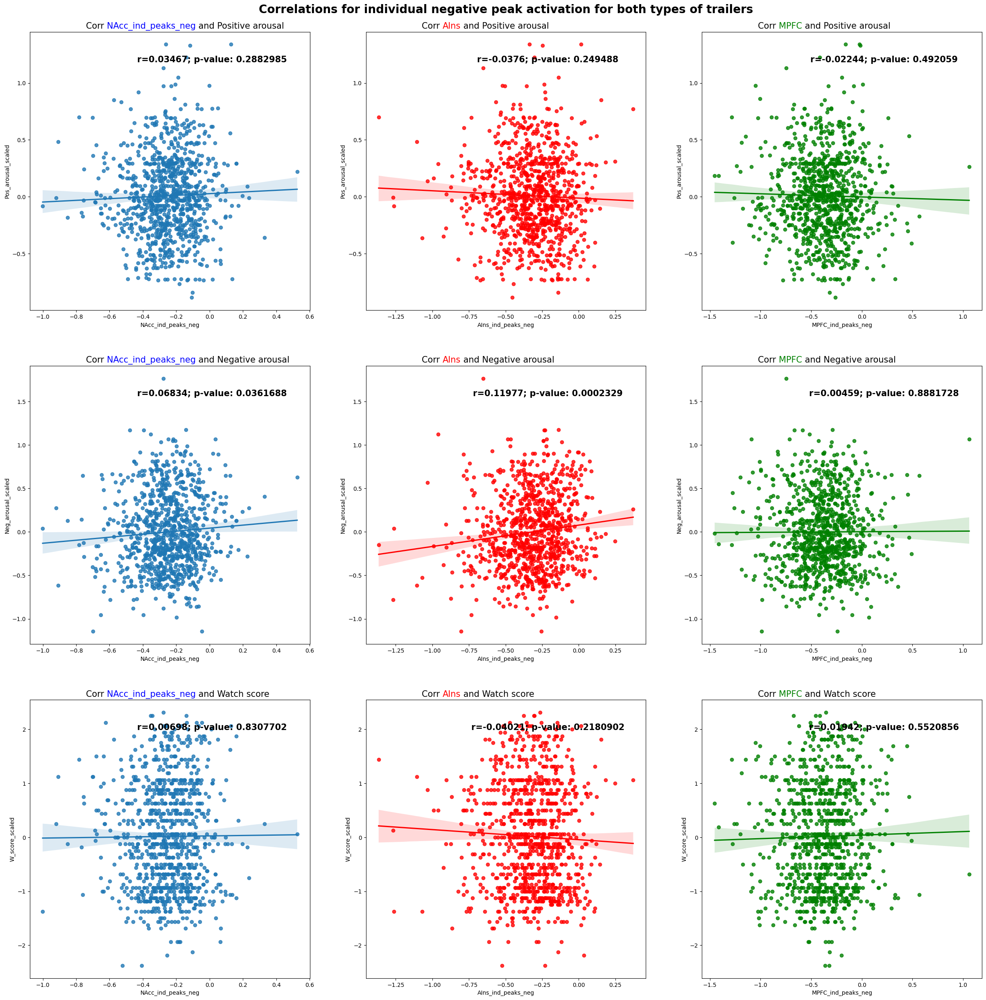

In [74]:
neg_peak_title = "Correlations for individual negative peak activation for both types of trailers"
compute_and_plot_corrs(all_participants_cleaned_df, "ind_peaks_neg", neg_peak_title)

The correlation between NAcc_ind_peaks_neg activation and positive arousal for Comedy trailers is: 0.03652 with a p-value of: 0.4280608167366949
The correlation between AIns_ind_peaks_neg activation and positive arousal for Comedy trailers is: 0.04773 with a p-value of: 0.3002097712752512
The correlation between MPFC_ind_peaks_neg activation and positive arousal for Comedy trailers is: -0.04445 with a p-value of: 0.33476983019528483

The correlation between NAcc_ind_peaks_neg activation and negative arousal for Comedy trailers is: 0.13603 with a p-value of: 0.0030333075014494595
The correlation between AIns_ind_peaks_neg activation and negative arousal for Comedy trailers is: 0.07657 with a p-value of: 0.0962406312920995
The correlation between MPFC_ind_peaks_neg activation and negative arousal for Comedy trailers is: 0.08177 with a p-value of: 0.07564104697875616

The correlation between NAcc_ind_peaks_neg activation and watch scores for Comedy trailers is: 0.01801 with a p-value of: 

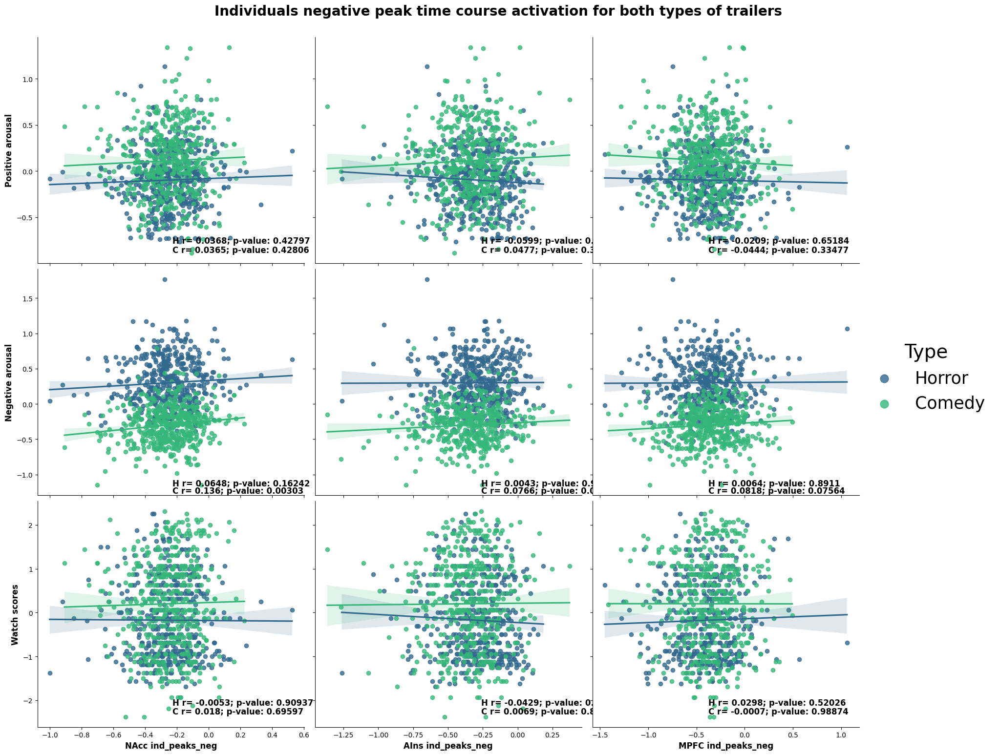

In [75]:
neg_peak_title = 'Individuals negative peak time course activation for both types of trailers'
compute_and_plot_both_corrs(all_participants_cleaned_df, all_subs_events_comedy, all_subs_events_horror, "ind_peaks_neg", neg_peak_title)

## Neural ISC

In [52]:
# Correlation with Positive Arousal.
NAcc_PA_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["W_score_scaled"])
AIns_W_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["W_score_scaled"])
MPFC_W_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_All_corr[1])))


For both types of trailers, the correlation between NAcc ISC activation and positive arousal is: 0.0479 with a p-value of: 0.14226606450915005
For both types of trailers, the correlation between AIns ISC activation and positive arousal is: 0.00614 with a p-value of: 0.8508406240729179
For both types of trailers, the correlation between MPFC ISC activation and positive arousal is: 0.05204 with a p-value of: 0.11084744911638263

For both types of trailers, the correlation between NAcc ISC activation and negative arousal is: -0.00946 with a p-value of: 0.772139931453745
For both types of trailers, the correlation between AIns ISC activation and negative arousal is: 0.00266 with a p-value of: 0.9350543807207862
For both types of trailers, the correlation between MPFC ISC activation and negative arousal is: 0.0704 with a p-value of: 0.030900258746641585

For both types of trailers, the correlation between NAcc ISC activation and watch scores is: 0.08084 with a p-value of: 0.0131627652252577

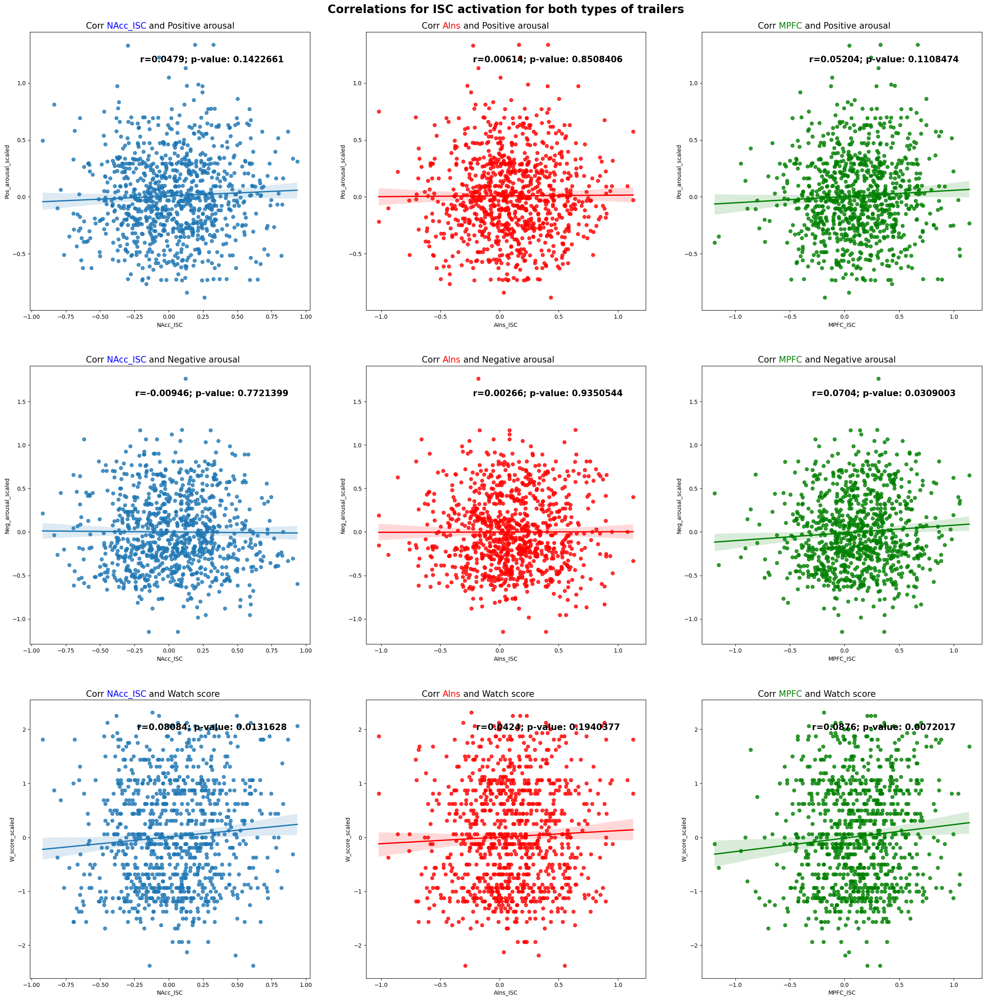

In [53]:
ISC_all_corr = [NAcc_PA_ISC_All_corr, NAcc_NA_ISC_All_corr, NAcc_W_ISC_All_corr, AIns_PA_ISC_All_corr, AIns_NA_ISC_All_corr, AIns_W_ISC_All_corr, MPFC_PA_ISC_All_corr, MPFC_NA_ISC_All_corr, MPFC_W_ISC_All_corr]
plot_correlations(all_subs_events_df, ISC_all_corr, "ISC", "Correlations for ISC activation for both types of trailers")


In [54]:
# ISC Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["W_score_scaled"])
AIns_W_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_C_corr[1])))


For comedy trailers, the correlation between NAcc ISC activation and positive arousal is: 0.09448 with a p-value of: 0.0399744551096573
For comedy trailers, the correlation between AIns ISC activation and positive arousal is: 0.01881 with a p-value of: 0.6833075574076634
For comedy trailers, the correlation between MPFC ISC activation and positive arousal is: 0.10759 with a p-value of: 0.019253977421514107

For comedy trailers, the correlation between NAcc ISC activation and negative arousal is: -0.00961 with a p-value of: 0.8348293963072364
For comedy trailers, the correlation between AIns ISC activation and negative arousal is: -0.03234 with a p-value of: 0.4829059968326514
For comedy trailers, the correlation between MPFC ISC activation and negative arousal is: 0.00593 with a p-value of: 0.8976786386664093

For comedy trailers, the correlation between NAcc ISC activation and watch scores is: 0.12489 with a p-value of: 0.006535691893747021
For comedy trailers, the correlation between

In [55]:
# ISC Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["W_score_scaled"])
AIns_W_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["W_score_scaled"])
MPFC_W_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_H_corr[1])))



For horror trailers, the correlation between NAcc ISC activation and positive arousal is: -0.02432 with a p-value of: 0.6001754170756053
For horror trailers, the correlation between AIns ISC activation and positive arousal is: -0.03149 with a p-value of: 0.4972645224322638
For horror trailers, the correlation between MPFC ISC activation and positive arousal is: 0.0005 with a p-value of: 0.9914693631386028

For horror trailers, the correlation between NAcc ISC activation and negative arousal is: 0.01345 with a p-value of: 0.771980279944285
For horror trailers, the correlation between AIns ISC activation and negative arousal is: 0.08853 with a p-value of: 0.05590668159535715
For horror trailers, the correlation between MPFC ISC activation and negative arousal is: 0.13951 with a p-value of: 0.002515056540054219

For horror trailers, the correlation between NAcc ISC activation and watch scores is: 0.01626 with a p-value of: 0.7260250204354992
For horror trailers, the correlation between AI

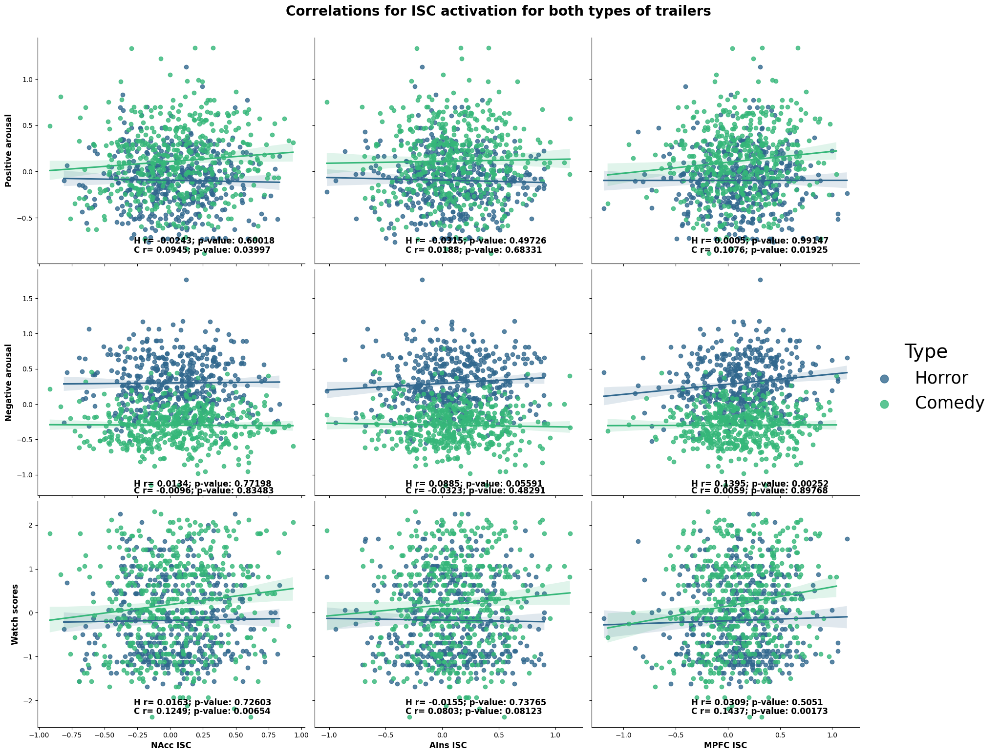

In [56]:
ISC_comedy_corr = [NAcc_PA_ISC_C_corr, NAcc_NA_ISC_C_corr, NAcc_W_ISC_C_corr, AIns_PA_ISC_C_corr, AIns_NA_ISC_C_corr, AIns_W_ISC_C_corr, MPFC_PA_ISC_C_corr, MPFC_NA_ISC_C_corr, MPFC_W_ISC_C_corr]
ISC_horror_corr = [NAcc_PA_ISC_H_corr, NAcc_NA_ISC_H_corr, NAcc_W_ISC_H_corr, AIns_PA_ISC_H_corr, AIns_NA_ISC_H_corr, AIns_W_ISC_H_corr, MPFC_PA_ISC_H_corr, MPFC_NA_ISC_H_corr, MPFC_W_ISC_H_corr]
plot_correlations3_bothTrailers(all_participants_cleaned_df, "ISC", ISC_comedy_corr, ISC_horror_corr, "Correlations for ISC activation for both types of trailers")


# Format data for LMM analysis.

In [60]:
# Open a datasets directory. 
fd = os.open("/Users/luisalvarez/Documents/GitHub/RM_Thesis_Neuroforecasting/ProcessedData", os.O_RDONLY)

# Use os.fchdir() method to change the current dir/folder.
os.fchdir(fd)

# Safe check- Print current working directory
print("Current working dir : %s" % os.getcwd())

root_path = os.getcwd()

Current working dir : /Users/luisalvarez/Documents/GitHub/RM_Thesis_Neuroforecasting/ProcessedData


In [ ]:
# Get average neural signals for each trailer. 
# Note, for comedy trailers I am using all subjects. 
# However, for horror trailers, I am removing participants who consistently dislike horror movies.

aggregate_df = all_participants_cleaned_df.groupby("Trailer", as_index=False, dropna=False).mean()
aggregate_df.reset_index(inplace=True)

In [61]:


# Get list of trailers in dataframe.
trailer_list = aggregate_df["Trailer"].unique().tolist()

# Create lists to store values. 
NAcc_trailer_peak_pos = []
AIns_trailer_peak_pos = []
MPFC_trailer_peak_pos = []

NAcc_trailer_peak_neg = []
AIns_trailer_peak_neg = []
MPFC_trailer_peak_neg = []

# Define keys. 
NAcc_TRs_keys = ['NAcc_TR1', 'NAcc_TR2', 'NAcc_TR3', 'NAcc_TR4', 'NAcc_TR5', 
                'NAcc_TR6', 'NAcc_TR7', 'NAcc_TR8', 'NAcc_TR9', 'NAcc_TR10',
                'NAcc_TR11', 'NAcc_TR12', 'NAcc_TR13', 'NAcc_TR14', 'NAcc_TR15']

AIns_TRs_keys = ['AIns_TR1', 'AIns_TR2', 'AIns_TR3', 'AIns_TR4', 'AIns_TR5',
                'AIns_TR6', 'AIns_TR7', 'AIns_TR8', 'AIns_TR9', 'AIns_TR10',
                'AIns_TR11', 'AIns_TR12', 'AIns_TR13', 'AIns_TR14', 'AIns_TR15']

MPFC_TRs_keys = ['MPFC_TR1', 'MPFC_TR2', 'MPFC_TR3', 'MPFC_TR4', 'MPFC_TR5',
                'MPFC_TR6', 'MPFC_TR7', 'MPFC_TR8', 'MPFC_TR9', 'MPFC_TR10',
                'MPFC_TR11', 'MPFC_TR12', 'MPFC_TR13', 'MPFC_TR14', 'MPFC_TR15']

# Calculate each trailer peak activation.
for trailer_id in range(aggregate_df.shape[0]):

    current_trailer = aggregate_df.iloc[trailer_id]["Trailer"]

    # Get time course for each region.
    NAcc_time_course = np.array(aggregate_df.iloc[trailer_id][NAcc_TRs_keys]).flatten()
    AIns_time_course = np.array(aggregate_df.iloc[trailer_id][AIns_TRs_keys]).flatten()
    MPFC_time_course = np.array(aggregate_df.iloc[trailer_id][MPFC_TRs_keys]).flatten()

    # Get peak activation for each region.
    NAcc_peak_pos = get_trailer_peak(NAcc_time_course, "max")
    AIns_peak_pos = get_trailer_peak(AIns_time_course, "max")
    MPFC_peak_pos = get_trailer_peak(MPFC_time_course, "max")

    NAcc_peak_neg = get_trailer_peak(NAcc_time_course, "min")
    AIns_peak_neg = get_trailer_peak(AIns_time_course, "min")
    MPFC_peak_neg = get_trailer_peak(MPFC_time_course, "min")

    # Append values to lists.
    NAcc_trailer_peak_pos.append(NAcc_peak_pos)
    AIns_trailer_peak_pos.append(AIns_peak_pos)
    MPFC_trailer_peak_pos.append(MPFC_peak_pos)

    NAcc_trailer_peak_neg.append(NAcc_peak_neg)
    AIns_trailer_peak_neg.append(AIns_peak_neg)
    MPFC_trailer_peak_neg.append(MPFC_peak_neg)

# Add values to dataframe.
aggregate_df["NAcc_trailer_peak_pos"] = NAcc_trailer_peak_pos
aggregate_df["AIns_trailer_peak_pos"] = AIns_trailer_peak_pos
aggregate_df["MPFC_trailer_peak_pos"] = MPFC_trailer_peak_pos

aggregate_df["NAcc_trailer_peak_neg"] = NAcc_trailer_peak_neg
aggregate_df["AIns_trailer_peak_neg"] = AIns_trailer_peak_neg
aggregate_df["MPFC_trailer_peak_neg"] = MPFC_trailer_peak_neg

aggregate_df.head()

,index,Trailer,Unnamed: 0,Onset,Offset,Duration,W_score,A_score,F_score,NAcc_onset,...,Onset_cooks,Middle_cooks,Offset_cooks,ISC_cooks,NAcc_trailer_peak_pos,AIns_trailer_peak_pos,MPFC_trailer_peak_pos,NAcc_trailer_peak_neg,AIns_trailer_peak_neg,MPFC_trailer_peak_neg
0,0,rc1,472.200000,108.0,138.0,30.0,3.100000,2.600000,3.566667,0.026341,...,0.044740,0.019131,0.021660,0.029103,0.026077,0.048315,-0.004129,-0.070883,-0.183863,-0.177087
1,1,rc10,491.071429,568.0,598.0,30.0,2.321429,2.035714,3.107143,-0.044825,...,0.032569,0.016623,0.019815,0.018345,0.053304,0.010309,0.113489,-0.089313,-0.150208,-0.152028
2,2,rc11,465.266667,512.0,542.0,30.0,2.100000,1.766667,3.333333,0.032974,...,0.043502,0.069782,0.032999,0.047401,0.036278,0.090703,0.219696,-0.035724,-0.143340,-0.091038
3,3,rc12,477.413793,656.0,686.0,30.0,1.931034,1.689655,2.965517,-0.078514,...,0.049259,0.073288,0.049413,0.042185,0.041789,0.013328,0.150022,-0.106370,-0.197886,-0.207321
4,4,rc2,456.400000,108.0,138.0,30.0,1.966667,1.733333,2.900000,-0.008600,...,0.028668,0.039381,0.024536,0.031953,0.023866,0.033392,0.311164,-0.049609,-0.177384,-0.075803


In [68]:
# After dropping outliers from the neural activation data, save the new dataframe to a csv file.
# Calculate the mean measures for each trailer accross participants.
#aggregate_df = all_participants_cleaned_df.groupby("Trailer", as_index=False, dropna=False).mean()
#aggregate_df.reset_index(inplace=True)

type_list = []
for id_trailer in range(len(aggregate_df)):
    if "c" in aggregate_df["Trailer"][id_trailer]:
        type_list.append("comedy")
    else:
        type_list.append("horror")

aggregate_df["Type"] = type_list

# I'm not sure why, but I am loosing the 'W_score' column. 
# I will add it back to the dataframe.
w_scores_dict = {}
for trailer_id in all_subs_events_df["Trailer"].unique():
    current_trailer_mean_w_score = all_subs_events_df[all_subs_events_df["Trailer"] == trailer_id]["W_score"].mean()
    w_scores_dict[trailer_id] = current_trailer_mean_w_score

w_scores_list = []
for trailer_id in aggregate_df["Trailer"].unique():
    w_scores_list.append(w_scores_dict[trailer_id])

aggregate_df["W_score"] = w_scores_list


# Re-order columns.
cols_ordered = ['Trailer', 'Type', 'Onset', 'Offset', 'Pos_arousal', 'Neg_arousal',
        'Pos_arousal_scaled', 'Neg_arousal_scaled', 'W_score', 'W_score_scaled',
        'NAcc_onset', 'AIns_onset', 'MPFC_onset',
        'NAcc_middle', 'AIns_middle', 'MPFC_middle', 'NAcc_offset',
        'AIns_offset', 'MPFC_offset', 'NAcc_whole', 'AIns_whole', 'MPFC_whole',
        #'NAcc_onset_z', 'AIns_onset_z', 'MPFC_onset_z', 'NAcc_middle_z',
        #'AIns_middle_z', 'MPFC_middle_z', 'NAcc_offset_z', 'AIns_offset_z',
        #'MPFC_offset_z',v'NAcc_whole_z', 'AIns_whole_z', 'MPFC_whole_z', 
        "NAcc_ind_peaks_pos", "AIns_ind_peaks_pos", "MPFC_ind_peaks_pos",
        "NAcc_ind_peaks_neg", "AIns_ind_peaks_neg", "MPFC_ind_peaks_neg",
        "NAcc_trailer_peak_pos", "AIns_trailer_peak_pos", "MPFC_trailer_peak_pos",
        "NAcc_trailer_peak_neg", "AIns_trailer_peak_neg", "MPFC_trailer_peak_neg",
        'NAcc_pos_peak','AIns_pos_peak', 'MPFC_pos_peak', 'NAcc_neg_peak', 
        'AIns_neg_peak', 'MPFC_neg_peak', 'NAcc_slope_peak', 'AIns_slope_peak',
        'MPFC_slope_peak', 'NAcc_slope_peak_avg', 'AIns_slope_peak_avg', 'MPFC_slope_peak_avg', 
        #'NAcc_narrow_slope_peak',
        #'AIns_narrow_slope_peak', 'MPFC_narrow_slope_peak',
        #'NAcc_narrow_slope_peak_avg', 'AIns_narrow_slope_peak_avg',
        #'MPFC_narrow_slope_peak_avg', 
        'NAcc_delta_peak', 'AIns_delta_peak',
        'MPFC_delta_peak', 'NAcc_delta_peak_avg', 'AIns_delta_peak_avg',
        'MPFC_delta_peak_avg', 
        #'NAcc_narrow_delta_peak',
        #'AIns_narrow_delta_peak', 'MPFC_narrow_delta_peak',
        #'NAcc_narrow_delta_peak_avg', 'AIns_narrow_delta_peak_avg',
        #'MPFC_narrow_delta_peak_avg', 
        'NAcc_ISC', 'AIns_ISC', 'MPFC_ISC',]

aggregate_df = aggregate_df[cols_ordered]

root_path = os.getcwd()

aggregate_df.to_csv(root_path + "/AllSubs_NeuralActivation_Aggregate_clean.csv", index=True)
aggregate_df

(32, 55)

In [63]:
# Read aggregate metrics dataframe. 
aggregate_metricts_path = "/Users/luisalvarez/Documents/SpanLab/Aggregate_metrics_labeled_updated.csv"

aggregate_metrics_df = pd.read_csv(aggregate_metricts_path)

# Remove nan.
aggregate_metrics_df.dropna(subset=['label'], inplace=True)
aggregate_metrics_df.reset_index(inplace=True)
aggregate_metrics_df

,index,number,title,label,year,Release time,genre,"released (1 = yes, 0 = no)",url to trailer,Domestic Gross,...,IMDb_vote,Unnamed: 33,Unnamed: 34,downloaded,video trimmed,audio extracted,budget,Unnamed: 39,Unnamed: 40,"The tool used to get the thumbnail: https://youtu.be/otNh9bTjXWg?si=NJaRcikG3tZUpNBl , size of thumbnail 640*480"
0,0,1,Joy Ride,rc1,2023,July 7,comedy,1,https://youtu.be/jyI-AM5VXDo?si=mZtAKMiPG0Ac2myk,12897789.0,...,9400.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"The pilot data collected by prolific, sample s..."
1,1,2,80 For Brady,rc2,2023,Feb 3,comedy,1,https://youtu.be/-UeGXB2NjR8?si=JU3SbpBjbO05o2xl,39330588.0,...,7600.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,3,A Man Called Otto,rc3,2022,Dec 30,comedy,1,https://youtu.be/eFYUX9l-m5I,64267657.0,...,43000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,4,Puss in Boots: The Last Wish,rc4,2022,Dec 21,comedy,1,https://youtu.be/RqrXhwS33yc?si=jhP7bbiB2SUukjNb,185535345.0,...,46000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,5,Strays,rc5,2023,Aug 18,comedy,1,https://youtu.be/26Xq6_g2r6Q?si=W1w0lLc7rlqiJ8TI,23988885.0,...,12000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,7,Champions,rc6,2023,Mar 10,comedy,1,https://youtu.be/pCHiWnj5Oek?si=3Rq4Yp7lOL2GySLb,16271910.0,...,11000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,8,Book Club: The Next Chapter,rc7,2023,May 12,comedy,1,https://youtu.be/i9k213d5FU0?si=B8j2urRDZmCpvSOJ,17556340.0,...,2900.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,10,11,No Hard Feelings,rc8,2023,23-Jun,comedy,1,https://youtu.be/P15S6ND8kbQ?si=gjAiNLYLM0PQdiXv,50452282.0,...,47000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,11,12,House Party,rc9,2023,13-Jan,comedy,1,https://youtu.be/XgOP67mTgZg?si=r135es4jieCvHxg7,9002247.0,...,2300.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,16,17,Easter Sunday,rc10,2022,5-Aug,comedy,1,https://youtu.be/YIixb42aJPg?si=W_YbI5jjV8SOzHAJ,13013690.0,...,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [64]:
# Join both dataframes.
aggregate_combined_df = aggregate_df.set_index('Trailer').join(aggregate_metrics_df.set_index('label'))

aggregate_combined_df.dropna(subset=['Gross_World_num'], inplace=True)
aggregate_combined_df.reset_index(inplace=True)

aggregate_combined_col = aggregate_combined_df.columns

print("The shape of the combined dataframe is: ", aggregate_combined_df.shape)

# Drop columns that are not needed.
aggregate_combined_df.drop(columns=["Onset", "Offset", 'NAcc_pos_peak',
       'AIns_pos_peak', 'MPFC_pos_peak', 'NAcc_neg_peak', 'AIns_neg_peak',
       'MPFC_neg_peak', 'NAcc_slope_peak', 'AIns_slope_peak',
       'MPFC_slope_peak', 'NAcc_slope_peak_avg', 'AIns_slope_peak_avg',
       'MPFC_slope_peak_avg', 
       #'NAcc_narrow_slope_peak', 'AIns_narrow_slope_peak', 'MPFC_narrow_slope_peak',
       #'NAcc_narrow_slope_peak_avg', 'AIns_narrow_slope_peak_avg', 'MPFC_narrow_slope_peak_avg', 
       'NAcc_delta_peak', 'AIns_delta_peak',
       'MPFC_delta_peak', 'NAcc_delta_peak_avg', 'AIns_delta_peak_avg',
       'MPFC_delta_peak_avg', 
       #'NAcc_narrow_delta_peak', 'AIns_narrow_delta_peak', 'MPFC_narrow_delta_peak',
       #'NAcc_narrow_delta_peak_avg', 'AIns_narrow_delta_peak_avg', 'MPFC_narrow_delta_peak_avg', 
       'year', 'Release time', 'genre',
       'released (1 = yes, 0 = no)', 'url to trailer', 'Unnamed: 33', 'Unnamed: 34',
       'The tool used to get the thumbnail: https://youtu.be/otNh9bTjXWg?si=NJaRcikG3tZUpNBl , size of thumbnail 640*480',
       'downloaded', 'video trimmed', 'audio extracted', 'budget', 'Unnamed: 39', 'Unnamed: 40'], inplace=True) 

print("After dropping columns, the shape of the combined dataframe is: ", aggregate_combined_df.shape)

# Calculate first month gross for US.
aggregate_combined_df["Gross_US_M1"] = aggregate_combined_df["Gross_US_W4_num"] 
aggregate_combined_df["Theaters_US_M1"] = aggregate_combined_df["Theaters_US_W1_num"] + aggregate_combined_df["Theaters_US_W2_num"] + aggregate_combined_df["Theaters_US_W3_num"] + aggregate_combined_df["Theaters_US_W4_num"]

# Save the new dataframe to a csv file.
aggregate_comedy_df = aggregate_combined_df[aggregate_combined_df["Type"] == "comedy"]
aggregate_comedy_df.reset_index(drop=True, inplace=True)
aggregate_comedy_df.to_csv(root_path + "/AllSubs_NeuralActivation_Aggregate_comedy.csv", index=True)

# Save the new dataframe to a csv file.
aggregate_horror_df = aggregate_combined_df[aggregate_combined_df["Type"] == "horror"]
aggregate_horror_df.reset_index(drop=True, inplace=True)
aggregate_horror_df.to_csv(root_path + "/AllSubs_NeuralActivation_Aggregate_horror.csv", index=True)

aggregate_combined_df.head(30)



The shape of the combined dataframe is:  (30, 97)
After dropping columns, the shape of the combined dataframe is:  (30, 63)


,Trailer,Type,Pos_arousal,Neg_arousal,Pos_arousal_scaled,Neg_arousal_scaled,W_score,W_score_scaled,NAcc_onset,AIns_onset,...,Total_Theaters_US,Total_weeks,Weeks_avg_per_theater,Gross_World_num,Released_Month,Budget,IMDb_rating,IMDb_vote,Gross_US_M1,Theaters_US_M1
0,rc1,comedy,1.797625,-0.306119,0.383411,-0.306119,3.100000,0.864583,0.026341,-0.119286,...,6041.0,4.0,2.0,15518636.0,7.0,20000000.0,7.0,9400.0,12897789.0,6041.0
1,rc10,comedy,1.493779,-0.325005,0.079565,-0.325005,2.321429,0.087054,-0.044825,-0.118324,...,9026.0,7.0,3.0,13021859.0,8.0,17000000.0,6.0,2.0,12660865.0,8478.0
2,rc11,comedy,1.468206,-0.367173,0.053992,-0.367173,2.100000,-0.189583,0.032974,0.082774,...,13576.0,7.0,4.0,39126983.0,9.0,NaN,5.0,4000.0,26897765.0,11880.0
3,rc12,comedy,1.328116,-0.289783,-0.086097,-0.289783,1.931034,-0.377155,-0.078514,-0.098542,...,6570.0,7.0,3.0,17657217.0,5.0,29100000.0,6.0,3900.0,11681574.0,6161.0
4,rc2,comedy,1.335897,-0.267018,-0.078317,-0.267018,1.966667,-0.322917,-0.008600,-0.057712,...,15397.0,7.0,4.0,40384027.0,2.0,28000000.0,6.0,7600.0,37473383.0,13367.0
5,rc3,comedy,1.510327,-0.339743,0.096114,-0.339743,2.655172,0.415948,0.055173,0.060110,...,24008.0,15.0,6.0,108641148.0,1.0,50000000.0,8.0,43000.0,39302864.0,8245.0
6,rc4,comedy,1.818621,-0.361815,0.404407,-0.361815,3.241379,1.008621,-0.004895,-0.008890,...,47972.0,18.0,11.0,485252376.0,12.0,90000000.0,8.0,46000.0,92969975.0,16232.0
7,rc5,comedy,1.594758,-0.192108,0.180544,-0.192108,2.566667,0.277083,0.020272,0.074342,...,11576.0,6.0,4.0,35958110.0,8.0,46000000.0,6.0,12000.0,23236435.0,10441.0
8,rc6,comedy,1.382806,-0.226893,-0.031408,-0.226893,2.266667,-0.022917,-0.075060,0.017974,...,9913.0,8.0,3.0,19115227.0,3.0,NaN,7.0,11000.0,15199130.0,9107.0
9,rc7,comedy,1.399418,-0.468188,-0.014796,-0.468188,2.000000,-0.235417,0.037204,0.036918,...,9079.0,6.0,3.0,29121628.0,5.0,20000000.0,6.0,2900.0,17274770.0,8742.0


In [65]:
aggregate_combined_df.to_csv(root_path + "/AllSubs_NeuralActivation_Aggregate_Combined_clean.csv", index=False)

# Separate files based on type of trailer. 
aggregate_combined_horror_df = aggregate_combined_df[aggregate_combined_df["Type"] == "horror"]
aggregate_combined_horror_df.reset_index(drop=True, inplace=True)
aggregate_combined_horror_df.to_csv(root_path +'/AllSubs_NeuralActivation_Aggregate_Combined_Horror_clean.csv')

aggregate_combined_comedy_df = aggregate_combined_df[aggregate_combined_df["Type"] == "comedy"]
aggregate_combined_comedy_df.reset_index(drop=True, inplace=True)
aggregate_combined_comedy_df.to_csv(root_path +'/AllSubs_NeuralActivation_Aggregate_Combined_Comedy_clean.csv')

#aggregate_combined_df.head(40)
aggregate_combined_comedy_df.head()

,Trailer,Type,Pos_arousal,Neg_arousal,Pos_arousal_scaled,Neg_arousal_scaled,W_score,W_score_scaled,NAcc_onset,AIns_onset,...,Total_Theaters_US,Total_weeks,Weeks_avg_per_theater,Gross_World_num,Released_Month,Budget,IMDb_rating,IMDb_vote,Gross_US_M1,Theaters_US_M1
0,rc1,comedy,1.797625,-0.306119,0.383411,-0.306119,3.100000,0.864583,0.026341,-0.119286,...,6041.0,4.0,2.0,15518636.0,7.0,20000000.0,7.0,9400.0,12897789.0,6041.0
1,rc10,comedy,1.493779,-0.325005,0.079565,-0.325005,2.321429,0.087054,-0.044825,-0.118324,...,9026.0,7.0,3.0,13021859.0,8.0,17000000.0,6.0,2.0,12660865.0,8478.0
2,rc11,comedy,1.468206,-0.367173,0.053992,-0.367173,2.100000,-0.189583,0.032974,0.082774,...,13576.0,7.0,4.0,39126983.0,9.0,NaN,5.0,4000.0,26897765.0,11880.0
3,rc12,comedy,1.328116,-0.289783,-0.086097,-0.289783,1.931034,-0.377155,-0.078514,-0.098542,...,6570.0,7.0,3.0,17657217.0,5.0,29100000.0,6.0,3900.0,11681574.0,6161.0
4,rc2,comedy,1.335897,-0.267018,-0.078317,-0.267018,1.966667,-0.322917,-0.008600,-0.057712,...,15397.0,7.0,4.0,40384027.0,2.0,28000000.0,6.0,7600.0,37473383.0,13367.0


In [66]:
aggregate_combined_comedy_df.head()

,Trailer,Type,Pos_arousal,Neg_arousal,Pos_arousal_scaled,Neg_arousal_scaled,W_score,W_score_scaled,NAcc_onset,AIns_onset,...,Total_Theaters_US,Total_weeks,Weeks_avg_per_theater,Gross_World_num,Released_Month,Budget,IMDb_rating,IMDb_vote,Gross_US_M1,Theaters_US_M1
0,rc1,comedy,1.797625,-0.306119,0.383411,-0.306119,3.100000,0.864583,0.026341,-0.119286,...,6041.0,4.0,2.0,15518636.0,7.0,20000000.0,7.0,9400.0,12897789.0,6041.0
1,rc10,comedy,1.493779,-0.325005,0.079565,-0.325005,2.321429,0.087054,-0.044825,-0.118324,...,9026.0,7.0,3.0,13021859.0,8.0,17000000.0,6.0,2.0,12660865.0,8478.0
2,rc11,comedy,1.468206,-0.367173,0.053992,-0.367173,2.100000,-0.189583,0.032974,0.082774,...,13576.0,7.0,4.0,39126983.0,9.0,NaN,5.0,4000.0,26897765.0,11880.0
3,rc12,comedy,1.328116,-0.289783,-0.086097,-0.289783,1.931034,-0.377155,-0.078514,-0.098542,...,6570.0,7.0,3.0,17657217.0,5.0,29100000.0,6.0,3900.0,11681574.0,6161.0
4,rc2,comedy,1.335897,-0.267018,-0.078317,-0.267018,1.966667,-0.322917,-0.008600,-0.057712,...,15397.0,7.0,4.0,40384027.0,2.0,28000000.0,6.0,7600.0,37473383.0,13367.0


In [67]:

"""
# # Correlation with Positive Arousal.
# NAcc_PA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Pos_arousal_scaled"])
# AIns_PA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Pos_arousal_scaled"])
# MPFC_PA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Pos_arousal_scaled"])

# # Correlation with Negative Arousal.
# NAcc_NA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Neg_arousal_scaled"])
# AIns_NA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Neg_arousal_scaled"])
# MPFC_NA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Neg_arousal_scaled"])

# # Correlation with Watch Scores.
# NAcc_W_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["W_score_scaled"])
# AIns_W_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["W_score_scaled"])
# MPFC_W_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["W_score_scaled"])

# print("For both types of trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_All_corr[1])))
# print("For both types of trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_All_corr[1])))
# print("For both types of trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_All_corr[1])))

# print("\nFor both types of trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_All_corr[1])))
# print("For both types of trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_All_corr[1])))
# print("For both types of trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_All_corr[1])))

# print("\nFor both types of trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_All_corr[1])))
# print("For both types of trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_All_corr[1])))
# print("For both types of trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_All_corr[1])))

# On_all_corr = [NAcc_PA_On_All_corr, NAcc_NA_On_All_corr, NAcc_W_On_All_corr, AIns_PA_On_All_corr, AIns_NA_On_All_corr, AIns_W_On_All_corr, MPFC_PA_On_All_corr, MPFC_NA_On_All_corr, MPFC_W_On_All_corr]
# plot_correlations(all_subs_events_df, On_all_corr, "onset", "Correlations for onset activation for both types of trailers")

# # Onset Neural Activation and PA-NA for Comedy Trailers.
# NAcc_PA_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["Pos_arousal_scaled"])
# AIns_PA_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["Pos_arousal_scaled"])
# MPFC_PA_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["Pos_arousal_scaled"])

# NAcc_NA_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["Neg_arousal_scaled"])
# AIns_NA_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["Neg_arousal_scaled"])
# MPFC_NA_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["Neg_arousal_scaled"])

# NAcc_W_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["W_score_scaled"])
# AIns_W_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["W_score_scaled"])
# MPFC_W_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["W_score_scaled"])

# print("For comedy trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_C_corr[1])))
# print("For comedy trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_C_corr[1])))
# print("For comedy trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_C_corr[1])))

# print("\nFor comedy trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_C_corr[1])))
# print("For comedy trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_C_corr[1])))
# print("For comedy trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_C_corr[1])))

# print("\nFor comedy trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_C_corr[1])))
# print("For comedy trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_C_corr[1])))
# print("For comedy trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_C_corr[1])))

# # Onset Neural Activation and PA-NA for Horror Trailers.
# NAcc_PA_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["Pos_arousal_scaled"])
# AIns_PA_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["Pos_arousal_scaled"])
# MPFC_PA_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["Pos_arousal_scaled"])

# NAcc_NA_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["Neg_arousal_scaled"])
# AIns_NA_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["Neg_arousal_scaled"])
# MPFC_NA_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["Neg_arousal_scaled"])

# NAcc_W_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["W_score_scaled"])
# AIns_W_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["W_score_scaled"])
# MPFC_W_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["W_score_scaled"])

# print("For horror trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_H_corr[1])))
# print("For horror trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_H_corr[1])))
# print("For horror trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_H_corr[1])))

# print("\nFor horror trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_H_corr[1])))
# print("For horror trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_H_corr[1])))
# print("For horror trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_H_corr[1])))

# print("\nFor horror trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_H_corr[1])))
# print("For horror trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_H_corr[1])))
# print("For horror trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_H_corr[1])))

# On_horror_corr = [NAcc_PA_On_H_corr, NAcc_NA_On_H_corr, NAcc_W_On_H_corr, AIns_PA_On_H_corr, AIns_NA_On_H_corr, AIns_W_On_H_corr, MPFC_PA_On_H_corr, MPFC_NA_On_H_corr, MPFC_W_On_H_corr]
# On_comedy_corr = [NAcc_PA_On_C_corr, NAcc_NA_On_C_corr, NAcc_W_On_C_corr, AIns_PA_On_C_corr, AIns_NA_On_C_corr, AIns_W_On_C_corr, MPFC_PA_On_C_corr, MPFC_NA_On_C_corr, MPFC_W_On_C_corr]
# plot_correlations3_bothTrailers(all_subs_events_df, "onset", On_comedy_corr, On_horror_corr, "Correlations for onset activation for both types of trailers")




# drop_threshold = 3.0 #2.4

# # Drop outliers from NAcc.
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole_z"] < drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole_z"] > -drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_onset_z"] < drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_onset_z"] > -drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle_z"] < drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle_z"] > -drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_offset_z"] < drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_offset_z"] > -drop_threshold]
# print("The shape of the dataframe after dropping 'NAcc' outliers is: ", all_subs_events_df.shape)

# # Drop outliers from AIns.
# all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_whole_z"] < drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_whole_z"] > -drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_onset_z"] < drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_onset_z"] > -drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_middle_z"] < drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_middle_z"] > -drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_offset_z"] < drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_offset_z"] > -drop_threshold]
# print("The shape of the dataframe after dropping 'AIns' outliers is: ", all_subs_events_df.shape)

# # Drop outliers from MPFC.
# all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_whole_z"] < drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_whole_z"] > -drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_onset_z"] < drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_onset_z"] > -drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_middle_z"] < drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_middle_z"] > -drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_offset_z"] < drop_threshold]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_offset_z"] > -drop_threshold]
# print("The shape of the dataframe after dropping 'MPFC' outliers is: ", all_subs_events_df.shape)

# # Drop outliers from negative arousal.
# all_subs_events_df = all_subs_events_df[all_subs_events_df["Neg_arousal_scaled"] < 1.5]
# print("The shape of the dataframe after dropping 'negative arousal' outliers is: ", all_subs_events_df.shape)

# # Drop other outliers outliers. 
# all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle"] > -0.6]
# all_subs_events_df = all_subs_events_df[all_subs_events_df["MPFC_middle"] < 1.2]


"""


'\n# # Correlation with Positive Arousal.\n# NAcc_PA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Pos_arousal_scaled"])\n# AIns_PA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Pos_arousal_scaled"])\n# MPFC_PA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Pos_arousal_scaled"])\n\n# # Correlation with Negative Arousal.\n# NAcc_NA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Neg_arousal_scaled"])\n# AIns_NA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Neg_arousal_scaled"])\n# MPFC_NA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Neg_arousal_scaled"])\n\n# # Correlation with Watch Scores.\n# NAcc_W_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["W_score_scaled"])\n# AIns_W_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["W_score_scaled"])\n# MPFC_